# Comparing models trained with LFP loss vs not

Looking at the saved neural data from these models

In [1]:
import os, scipy.io 
import numpy as np 
# %matplotlib ipympl
import matplotlib.pyplot as plt 
from mpl_toolkits.mplot3d import axes3d
import pickle as pk
import sys
import importlib

sys.path.append('/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils')
import load_data as ld
import population_utils as pu

2025-09-11 12:10:08.727759: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-09-11 12:10:08.744521: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-09-11 12:10:08.756345: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-09-11 12:10:08.765840: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-09-11 12:10:08.774683: I tensorflow/core/platform/cpu_feature_guar

## get list of trained models

In [2]:
# lfp models (lfp) — theta

lfp_model_dir = '/home/nuttidalab/Documents/renee/lfp_models/models/xor/P_rec_0.2_Taus_4.0_25.0'
# lfp_model_list = os.listdir(lfp_model_dir)
# lfp_model_list = [m for m in lfp_model_list if m.endswith('.mat') and m.]
lfp_theta_model_list = ld.find_files_keywords(lfp_model_dir, ['Jitter_10_10', '4.0_8.0', '.mat'])
# remove directories 
lfp_theta_model_list = [m.split('/')[-1] for m in lfp_theta_model_list]
lfp_theta_model_list.sort()

# remove the last model, which was trained with different parameters
lfp_theta_model_list = lfp_theta_model_list[:-1]
# print(lfp_theta_model_list)
print(len(lfp_theta_model_list))

perfs = []
train_trials = []
for i, model_name in enumerate(lfp_theta_model_list):
    model_path = os.path.join(lfp_model_dir, model_name)
    model_data = scipy.io.loadmat(model_path)
    perfs.append(model_data['eval_perf_mean'][0][0])
    train_trials.append(model_data['tr'][0][0])
    print(f'Model: {model_name}, Test perf: {perfs[i]}, Train trials: {train_trials[i]}')

43
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_03_234639.mat, Test perf: 0.99, Train trials: 14501
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_03_234746.mat, Test perf: 0.99, Train trials: 15101
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_03_235932.mat, Test perf: 0.98, Train trials: 22901
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_04_001147.mat, Test perf: 0.99, Train trials: 14401
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_04_001501.mat, Test perf: 0.98, Train trials: 16001
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_04_002309.mat, Test perf: 1.0, Train trials: 13401
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_04_005236.mat, Test perf: 0.97, Train trials: 17401
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_04_010607.mat, Test perf: 1.0, Train trials: 7801
Model: Task_xor_N_200_Jitter_10_10_LFP_4.0_8.0_2025_09_04_014146.mat, Test perf: 1.0, Train trials: 12101
Model: Task_xor_N_200_Jitter_10_10_LFP

## study models generated data, delay=400

### dict keys
neural_dict has 2 keys:
- 'r' is trials x neurons x time
- 'epsp' is trials x time

bhv_dict has 2 keys:
- 'perf' is trials (0/1)
- 'trial_type' is list of length trials
    - if changed to np.array, is trials x 2

In [ ]:
# base code for loading data for each model type

model_lists = [xlfp_model_list, lfp_theta_model_list] #, lfp_alpha_model_list]
model_dirs = [xlfp_model_dir, lfp_model_dir] #, lfp_model_dir]
model_list_names = ['xlfp', 'lfp_theta'] #, 'lfp_alpha']

for model_lists, model_dirs, model_list_names in zip(model_lists, model_dirs, model_list_names):
    model_list = model_lists
    model_dir = model_dirs
    model_list_name = model_list_names

    print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

    for model_name in model_list:
        print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, 'neural_dict.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, 'bhv_dict.pkl'), 'rb'))

        break
    break


In [3]:
settings = {
        'T': 650, # trial duration (in steps)
        'stim_on': 50, # input stim onset (in steps)
        'stim_dur': 50, # input stim duration (in steps)
        'delay': 400, # delay b/w the two stimuli (in steps)
        'DeltaT': 1, # sampling rate
        'taus': 20, # decay time-constants (in steps)
        'lfp_power_target': [4, 8], # theta
        'fs': 200,
        'task': 'xor', # task name
        }

Wilcoxon test statistic: 18.00, p-value: 0.00


/tmp/ipykernel_337642/3851362243.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([perfs, perfs_delay400], labels=['delay 50', 'delay 400'])


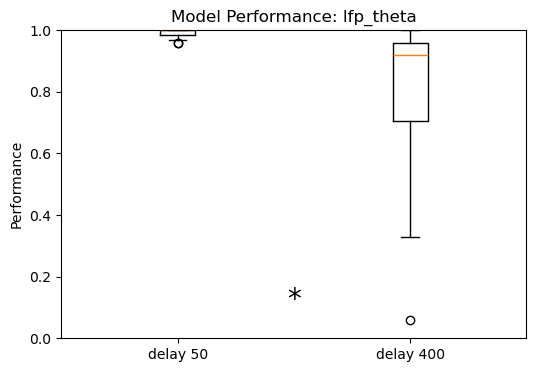

In [6]:
# performance plots, comparing delay=50 to delay=400, without lesioning

model_list = lfp_theta_model_list
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'

# create figure
fig = plt.figure(figsize=(6, 4))

perfs_delay400 = []
for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    # neural_dict = pk.load(open(os.path.join(output_dir, 'neural_dict_delay400.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, 'bhv_dict_delay400.pkl'), 'rb'))
    perfs_delay400.append(np.mean(bhv_dict['perf']))
    
# plot perfs and perfs_delay400
plt.boxplot([perfs, perfs_delay400], labels=['delay 50', 'delay 400'])
from scipy.stats import mannwhitneyu, wilcoxon
stat, p = wilcoxon(perfs, perfs_delay400)
print("Wilcoxon test statistic: %.2f, p-value: %.2f" % (stat, p))
# stat, p = mannwhitneyu(perfs, perfs_delay400)
# print("Mann-Whitney U test statistic: %.2f, p-value: %.2f" % (stat, p))
if p<0.05:
    plt.text(1.5, 0.1, '*', fontsize=20, ha='center')
plt.ylabel('Performance')
plt.title(f'Model Performance: {model_list_name}')
plt.ylim([0, 1])
plt.show()

#### ii130

Kruskal-Wallis test statistic: 84.25, p-value: 0.00
Wilcoxon test between delay400_ii50 and delay400: statistic: 0.00, p-value: 0.00
Wilcoxon test between delay400 and delay400_ii130: statistic: 259.00, p-value: 0.04
Wilcoxon test between delay400_ii50 and delay400_ii130: statistic: 0.00, p-value: 0.00


/tmp/ipykernel_337642/1836541650.py:22: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(perfs_condn.T, labels=condn_names)


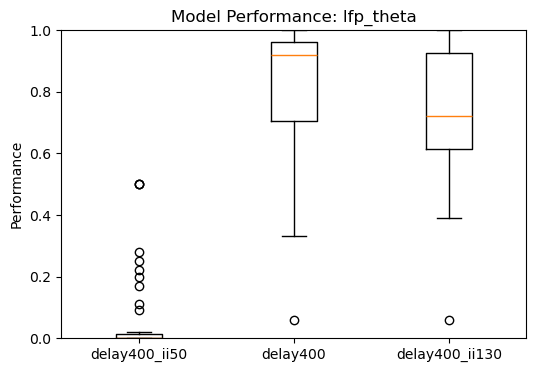

In [ ]:
# performance plots, comparing delay=400 with lesioning

condn_names = ['delay400_ii50', 'delay400','delay400_ii130']

model_list = lfp_theta_model_list
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'


perfs_condn = np.zeros((len(condn_names), len(model_list)))
for i, condn_name in enumerate(condn_names):
    for j, model_name in enumerate(model_list):
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        # neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        perfs_condn[i, j] = np.mean(bhv_dict['perf'])
    
fig = plt.figure(figsize=(6, 4))
plt.boxplot(perfs_condn.T, labels=condn_names)
from scipy.stats import kruskal
stat, p = kruskal(perfs_condn[0,:], perfs_condn[1,:], perfs_condn[2,:])
print("Kruskal-Wallis test statistic: %.2f, p-value: %.2f" % (stat, p))

# signrank between conditions
from scipy.stats import wilcoxon
stat, p = wilcoxon(perfs_condn[0,:], perfs_condn[1,:])
print("Wilcoxon test between delay400_ii50 and delay400: statistic: %.2f, p-value: %.2f" % (stat, p))
stat, p = wilcoxon(perfs_condn[1,:], perfs_condn[2,:])
print("Wilcoxon test between delay400 and delay400_ii130: statistic: %.2f, p-value: %.2f" % (stat, p))
stat, p = wilcoxon(perfs_condn[0,:], perfs_condn[2,:])
print("Wilcoxon test between delay400_ii50 and delay400_ii130: statistic: %.2f, p-value: %.2f" % (stat, p))
    
plt.ylabel('Performance')
plt.title(f'Model Performance: {model_list_name}')
plt.ylim([0, 1])
plt.show()


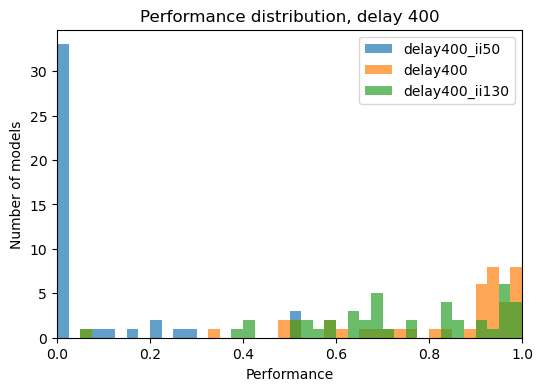

In [ ]:
# histogram of perfs_delay400

plt.figure(figsize=(6,4))
plt.hist(perfs_condn[0,:], bins=40, range=(0,1), alpha=0.7)
plt.hist(perfs_condn[1,:], bins=40, range=(0,1), alpha=0.7)
plt.hist(perfs_condn[2,:], bins=40, range=(0,1), alpha=0.7)
plt.legend(['delay400_ii50', 'delay400','delay400_ii130'])
plt.xlabel('Performance')
plt.ylabel('Number of models')
plt.title('Performance distribution, delay 400')
plt.xlim([0, 1])
plt.show()

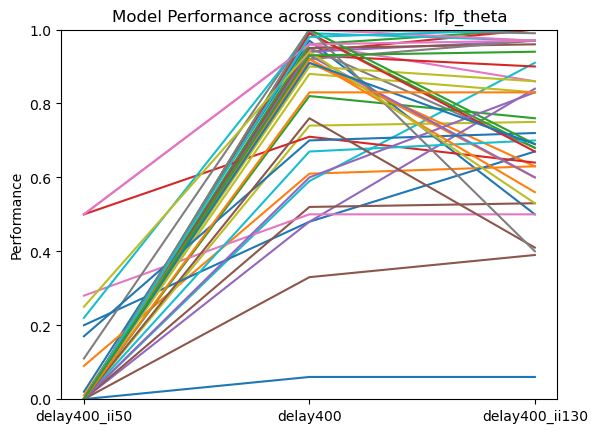

In [ ]:
plt.figure()
plt.plot(perfs_condn)
plt.xticks(range(3), condn_names)
plt.ylabel('Performance')
plt.title(f'Model Performance across conditions: {model_list_name}')
plt.ylim([0, 1])
plt.show()

#### ii110

Kruskal-Wallis test statistic: 84.13, p-value: 0.00
Wilcoxon test between delay400_ii50 and delay400: statistic: 0.00, p-value: 0.00
Wilcoxon test between delay400 and delay400_ii110: statistic: 190.00, p-value: 0.01
Wilcoxon test between delay400_ii50 and delay400_ii110: statistic: 0.00, p-value: 0.00


/tmp/ipykernel_390035/1538406918.py:23: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(perfs_condn.T, labels=condn_names)


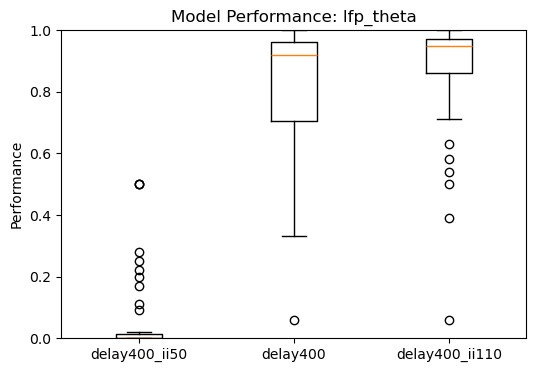

In [4]:
# performance plots, comparing delay=400 with lesioning (110%)

# condn_names = ['delay400_ii50', 'delay400','delay400_ii130']
condn_names = ['delay400_ii50', 'delay400','delay400_ii110']

model_list = lfp_theta_model_list
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'


perfs_condn = np.zeros((len(condn_names), len(model_list)))
for i, condn_name in enumerate(condn_names):
    for j, model_name in enumerate(model_list):
        # print(f"\nModel: {model_name}")
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        
        # get neural and behavioral data
        # neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        perfs_condn[i, j] = np.mean(bhv_dict['perf'])
    
fig = plt.figure(figsize=(6, 4))
plt.boxplot(perfs_condn.T, labels=condn_names)
from scipy.stats import kruskal
stat, p = kruskal(perfs_condn[0,:], perfs_condn[1,:], perfs_condn[2,:])
print("Kruskal-Wallis test statistic: %.2f, p-value: %.2f" % (stat, p))

# signrank between conditions
from scipy.stats import wilcoxon
stat, p = wilcoxon(perfs_condn[0,:], perfs_condn[1,:])
print("Wilcoxon test between delay400_ii50 and delay400: statistic: %.2f, p-value: %.2f" % (stat, p))
stat, p = wilcoxon(perfs_condn[1,:], perfs_condn[2,:])
print("Wilcoxon test between delay400 and delay400_ii110: statistic: %.2f, p-value: %.2f" % (stat, p))
stat, p = wilcoxon(perfs_condn[0,:], perfs_condn[2,:])
print("Wilcoxon test between delay400_ii50 and delay400_ii110: statistic: %.2f, p-value: %.2f" % (stat, p))
    
plt.ylabel('Performance')
plt.title(f'Model Performance: {model_list_name}')
plt.ylim([0, 1])
plt.show()


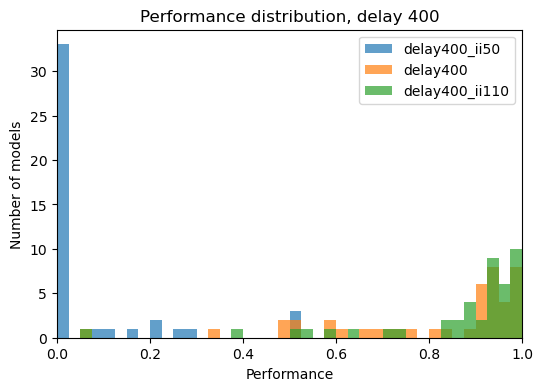

In [23]:
# histogram of perfs_delay400

plt.figure(figsize=(6,4))
plt.hist(perfs_condn[0,:], bins=40, range=(0,1), alpha=0.7)
plt.hist(perfs_condn[1,:], bins=40, range=(0,1), alpha=0.7)
plt.hist(perfs_condn[2,:], bins=40, range=(0,1), alpha=0.7)
plt.legend(['delay400_ii50', 'delay400','delay400_ii110'])
plt.xlabel('Performance')
plt.ylabel('Number of models')
plt.title('Performance distribution, delay 400')
plt.xlim([0, 1])
plt.show()

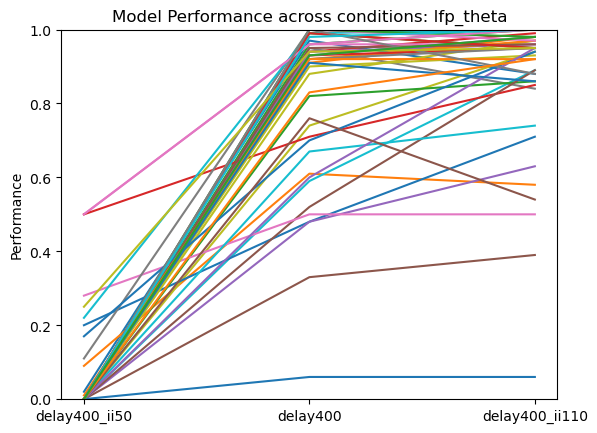

In [24]:
plt.figure()
plt.plot(perfs_condn)
plt.xticks(range(3), condn_names)
plt.ylabel('Performance')
plt.title(f'Model Performance across conditions: {model_list_name}')
plt.ylim([0, 1])
plt.show()

### separate out models with performance 60-90%

In [5]:
bad_models_idx = np.where((perfs_condn[1,:] > 0.6) & (perfs_condn[1,:] < 0.9))[0] # no lesion condition
print(bad_models_idx, len(bad_models_idx))
good_models_idx = np.where(perfs_condn[1,:] >= 0.95)[0]
print(good_models_idx, len(good_models_idx))

[ 1  8 12 13 18 29 30 35 41] 9
[ 0  2  6  7 17 19 22 25 26 32 33 36 37 39] 14


PCA explained variance: [0.39286362 0.22520679 0.17313737], total: 0.7912077841102216
PCA explained variance: [0.67224918 0.11145779 0.06124737], total: 0.8449543412185655
PCA explained variance: [0.69529329 0.09959112 0.07083301], total: 0.8657174099488162
PCA explained variance: [0.58469088 0.21626502 0.06171685], total: 0.8626727562803148
PCA explained variance: [0.64616806 0.1262899  0.071065  ], total: 0.8435229690654996
PCA explained variance: [0.41622217 0.23053316 0.10191519], total: 0.7486705187146167
PCA explained variance: [0.57174932 0.19591515 0.08927156], total: 0.8569360217156612
PCA explained variance: [0.63858411 0.12377614 0.07193049], total: 0.8342907470591582
PCA explained variance: [0.62693681 0.11739465 0.09075101], total: 0.8350824800166027


Text(0.5, 0.98, 'Population trajectory PCA (correct only), model type: lfp_theta, condn: delay400')

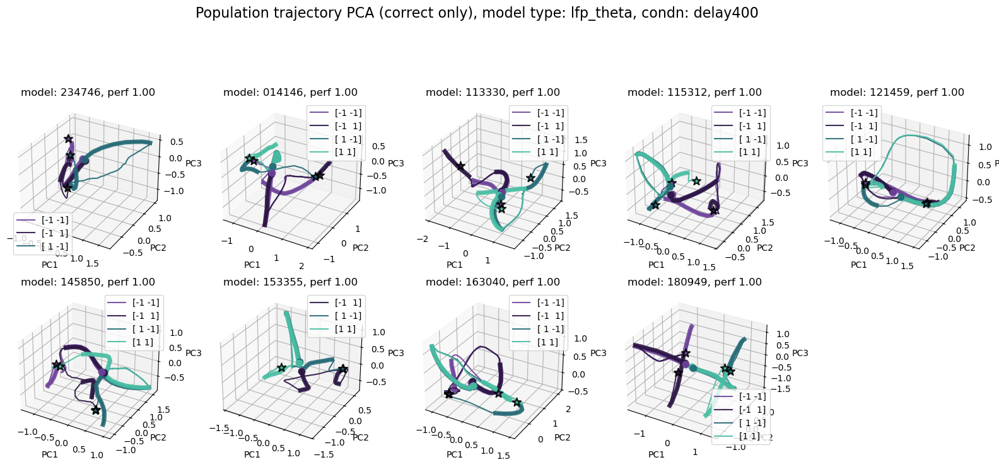

In [34]:
# trajectories for correct trials only

model_list = [lfp_theta_model_list[i] for i in bad_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400'

# create figure
fig = plt.figure(figsize=(20, 15))

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    correct_trials = np.where(bhv_dict['perf'] == 1)[0]
    neural_dict['r'] = neural_dict['r'][correct_trials, :, :]
    bhv_dict['trial_type'] = np.array(bhv_dict['trial_type'])[correct_trials]
    bhv_dict['perf'] = np.array(bhv_dict['perf'])[correct_trials]
    
    ax = fig.add_subplot(4, 5, model_list.index(model_name)+1, projection='3d')
    ax, _ = pu.plot_trajectory_pca(rates_data=neural_dict['r'], trial_labels=np.array(bhv_dict['trial_type']), 
                    settings=settings, cut_off=50, plot=1, ds=5, smooth=2, ax=ax,
                    title=f'model: {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')

fig.suptitle(f'Population trajectory PCA (correct only), model type: {model_list_name}, condn: {condn_name}', fontsize=16)

PCA explained variance: [0.46545297 0.2086553  0.14765332], total: 0.8217615832661154
PCA explained variance: [0.72387319 0.09050639 0.05594369], total: 0.8703232768788859
PCA explained variance: [0.72298184 0.08448353 0.07580162], total: 0.883266986351416
PCA explained variance: [0.60667554 0.20118708 0.05656208], total: 0.8644246950522305
PCA explained variance: [0.66680097 0.1191087  0.06955245], total: 0.8554621305656304
PCA explained variance: [0.49479102 0.19170203 0.09277617], total: 0.779269215959479
PCA explained variance: [0.55332828 0.2432378  0.05712465], total: 0.8536907331283154
PCA explained variance: [0.61205292 0.11472972 0.0973649 ], total: 0.8241475342666329
PCA explained variance: [0.64190827 0.11835739 0.0832592 ], total: 0.8435248606575337


Text(0.5, 0.98, 'Population trajectory PCA (correct only), model type: lfp_theta, condn delay400_ii110')

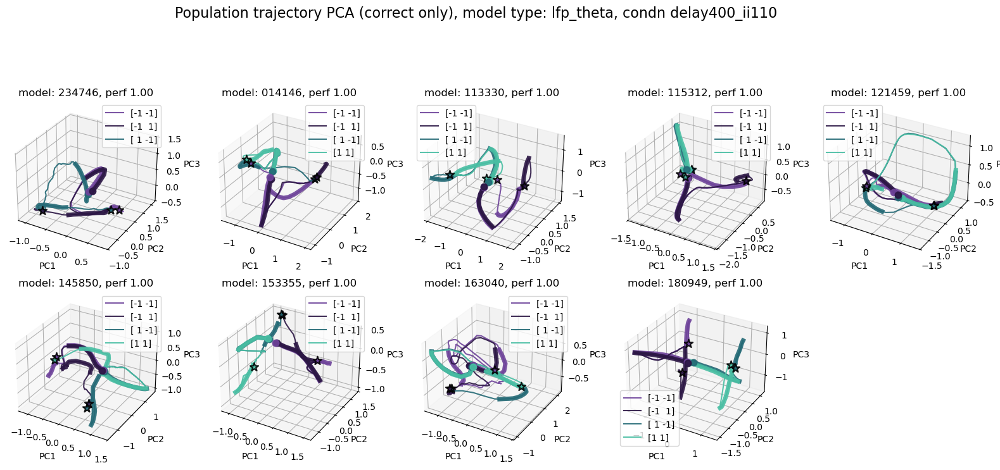

In [35]:
# trajectories for correct trials only -- LESION 110

model_list = [lfp_theta_model_list[i] for i in bad_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400_ii110'

# create figure
fig = plt.figure(figsize=(20, 15))

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    correct_trials = np.where(bhv_dict['perf'] == 1)[0]
    neural_dict['r'] = neural_dict['r'][correct_trials, :, :]
    bhv_dict['trial_type'] = np.array(bhv_dict['trial_type'])[correct_trials]
    bhv_dict['perf'] = np.array(bhv_dict['perf'])[correct_trials]
    
    ax = fig.add_subplot(4, 5, model_list.index(model_name)+1, projection='3d')
    ax, _ = pu.plot_trajectory_pca(rates_data=neural_dict['r'], trial_labels=np.array(bhv_dict['trial_type']), 
                    settings=settings, cut_off=50, plot=1, ds=5, smooth=2, ax=ax,
                    title=f'model: {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')

fig.suptitle(f'Population trajectory PCA (correct only), model type: {model_list_name}, condn {condn_name}', fontsize=16)

##### plot EPSP

In [6]:
# spect calculation function in numpy

def compute_lfp_power_np(epsp, settings):
    """
    Compute band-limited z-scored LFP power using Morlet wavelets (NumPy version).

    Parameters
    ----------
    epsp : list or np.ndarray
        Length-T list or array of scalar values (e.g., EPSP signal).
    settings : dict
        Dictionary containing:
            - 'T': int, length of the signal
            - 'fs': float, sampling frequency in Hz
            - 'lfp_power_target': list or tuple of [low_freq, high_freq]
            - 'stim_on': int, time index of stimulus onset

    Returns
    -------
    lfp_power_z : np.ndarray
        Z-scored LFP power in the target frequency band. Shape [T]
    """
    # --- settings ---
    T = settings['T']
    fs = settings['fs']
    dt = 1.0 / fs
    fmin, fmax = 4.0, 100.0
    num_freqs = 40
    band_lo, band_hi = settings['lfp_power_target']
    stim_on = settings['stim_on']

    # --- epsp input processing ---
    epsp_vec = np.squeeze(np.stack(epsp, axis=0))  # [T]
    epsp_sig = np.reshape(epsp_vec, [1, T, 1])      # [1, T, 1]

    # --- frequencies & scales ---
    freqs = np.exp(np.linspace(np.log(fmin), np.log(fmax), num_freqs))
    fc = 0.8125  # Morlet central frequency
    scales = fc / (freqs * dt)

    # --- build Morlet kernels ---
    K = 6.0
    f_low = fmin
    sigma_t_low = K / (2.0 * np.pi * f_low)
    half_width_sec = 4.0 * sigma_t_low
    kernel_len = int(round(2.0 * half_width_sec * fs) + 1)
    kernel_len = max(kernel_len, 31)

    t_idx = np.arange(kernel_len, dtype=np.float32) - (kernel_len - 1) / 2.0
    t_sec = t_idx / fs

    two_pi = 2.0 * np.pi
    sigma_t = K / (two_pi * freqs)  # [F]

    env = np.exp(-0.5 * (np.expand_dims(t_sec, 1) / np.expand_dims(sigma_t, 0))**2)
    phase = two_pi * np.expand_dims(t_sec, 1) * np.expand_dims(freqs, 0)
    cos_part = env * np.cos(phase)
    sin_part = env * np.sin(phase)

    # L2 normalize
    eps_norm = 1e-8
    norm = np.sqrt(np.sum(cos_part**2 + sin_part**2, axis=0, keepdims=True) + eps_norm)
    cos_part /= norm
    sin_part /= norm

    # Filters: [L, 1, F]
    cos_filt = np.expand_dims(cos_part, axis=1)
    sin_filt = np.expand_dims(sin_part, axis=1)

    # --- convolution with SAME padding ---
    def conv1d_same(x, filt):
        pad_len = filt.shape[0] // 2
        x_padded = np.pad(x, ((0, 0), (pad_len, pad_len), (0, 0)), mode='constant')
        output = np.zeros((x.shape[0], x.shape[1], filt.shape[2]))
        for f in range(filt.shape[2]):
            kernel = filt[:, 0, f][::-1]  # reverse for conv
            for b in range(x.shape[0]):
                output[b,:,f] = np.convolve(x_padded[b,:,0], kernel, mode='valid')
        return output

    real_coeff = conv1d_same(epsp_sig, cos_filt)  # [1, T, F]
    imag_coeff = conv1d_same(epsp_sig, sin_filt)  # [1, T, F]
    power = real_coeff**2 + imag_coeff**2        # [1, T, F]
    power = np.squeeze(power, axis=0)            # [T, F]

    # --- band selection ---
    band_mask = np.logical_and(freqs >= band_lo, freqs <= band_hi)
    band_mask_f = band_mask.astype(np.float32)
    denom = max(np.sum(band_mask_f), 1.0)
    band_power = np.dot(power, band_mask_f / denom)  # [T]

    # --- baseline z-scoring ---
    start = 10
    stop = int(stim_on)
    base_slice = band_power[start:stop]
    base_mean = np.mean(base_slice)
    base_std = np.std(base_slice) + 1e-8
    lfp_power_z = (band_power - base_mean) / base_std  # [T]

    return power, freqs, lfp_power_z


Processing model type: lfp_theta, number of models: 9


Text(0.5, 0.98, 'LFP Band Power by Correct/Incorrect, model type: lfp_theta, condn: delay400')

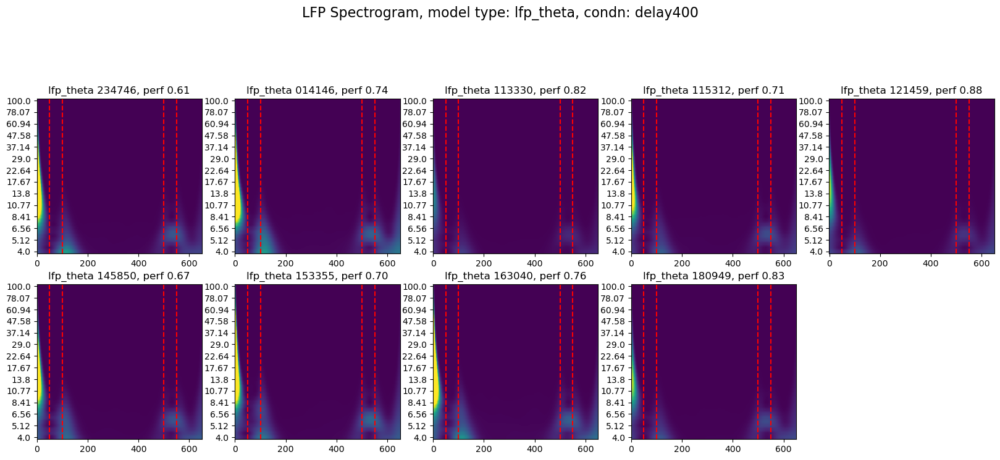

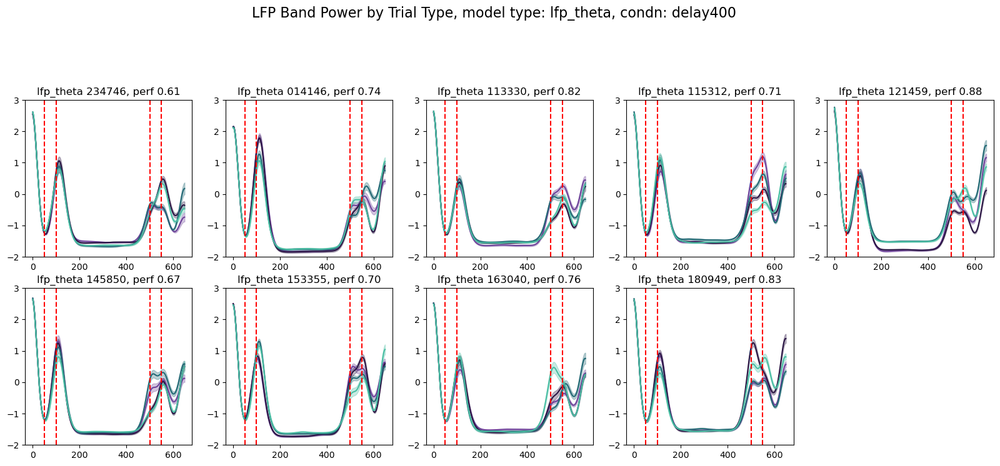

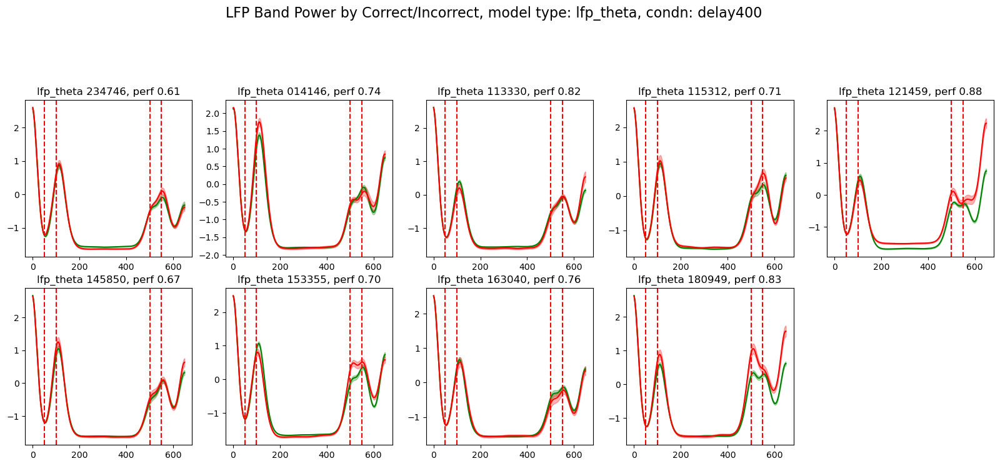

In [40]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- NO LESION

# model_list = lfp_theta_model_list
model_list = [lfp_theta_model_list[i] for i in bad_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig1 = plt.figure(figsize=(20, 15)) # spectrogram
fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, 'neural_dict_delay400.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, 'bhv_dict_delay400.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # first plot spectrogram
    ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
    ax1.imshow(avg_power.T, aspect='auto', origin='lower',
            vmin=0, vmax=1.2)
    ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
    # ax1.colorbar(label='Power')
    ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    
    # then plot band power, split by trial type
    ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
    stims, colors = ld.get_trialtype_colors()
    trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == i)
        powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
        powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
        ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
        ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
    ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax2.set_ylim([-2, 3])
    
    # finally plot band power, split by correct/incorrect
    ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
    ax3.plot(powerband_mean, color='g', label='correct')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax3.plot(powerband_mean, color='r', label='incorrect')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
    ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')

fig1.suptitle(f'LFP Spectrogram, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig2.suptitle(f'LFP Band Power by Trial Type, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig3.suptitle(f'LFP Band Power by Correct/Incorrect, model type: {model_list_name}, condn: {condn_name}', fontsize=16)


Processing model type: lfp_theta, number of models: 9


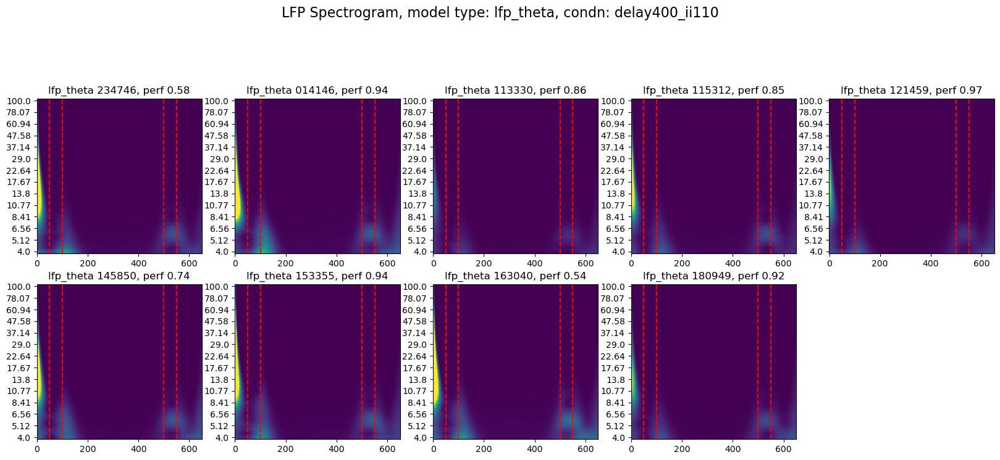

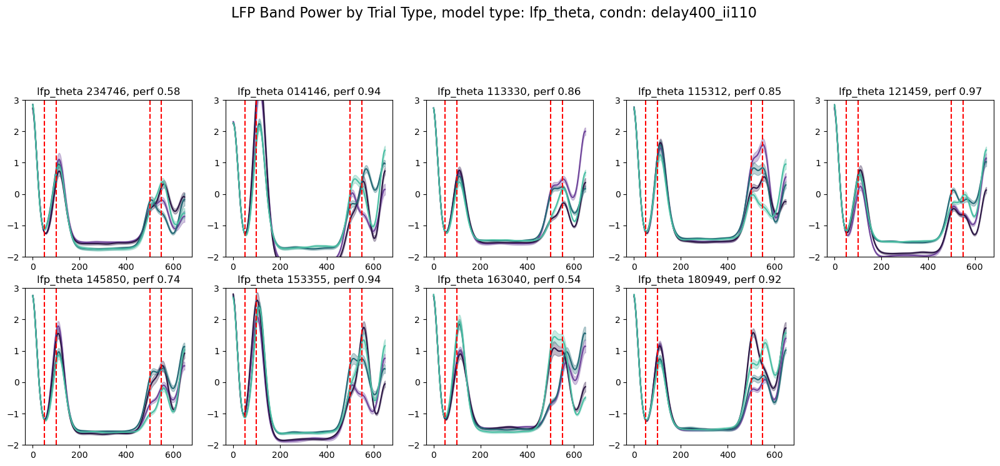

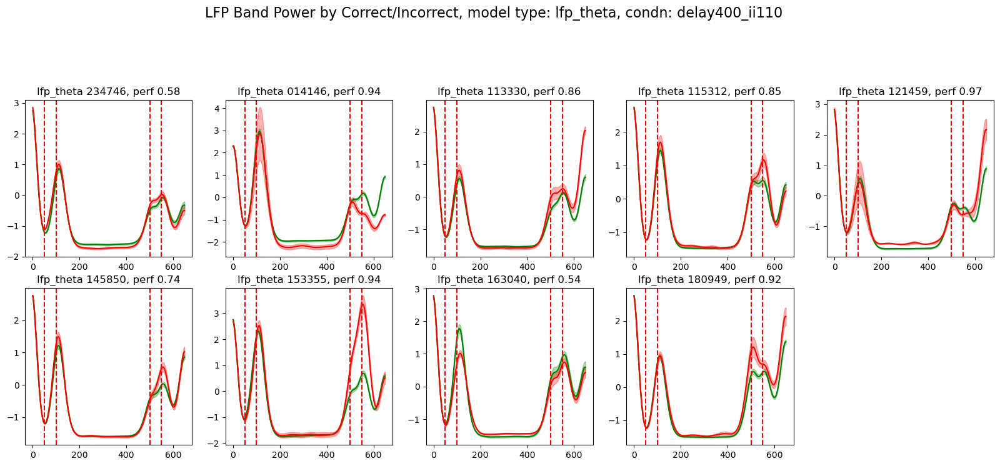

In [41]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- LESION 110

# model_list = lfp_theta_model_list
model_list = [lfp_theta_model_list[i] for i in bad_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400_ii110'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig1 = plt.figure(figsize=(20, 15)) # spectrogram
fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, 'neural_dict_delay400_ii110.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, 'bhv_dict_delay400_ii110.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # first plot spectrogram
    ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
    ax1.imshow(avg_power.T, aspect='auto', origin='lower',
            vmin=0, vmax=1.2)
    ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
    # ax1.colorbar(label='Power')
    ax1.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    
    # then plot band power, split by trial type
    ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
    stims, colors = ld.get_trialtype_colors()
    trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == i)
        powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
        powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
        ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
        ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
    ax2.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax2.set_ylim([-2, 3])
    
    # finally plot band power, split by correct/incorrect
    ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
    ax3.plot(powerband_mean, color='g', label='correct')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax3.plot(powerband_mean, color='r', label='incorrect')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
    ax3.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')

fig1.suptitle(f'LFP Spectrogram, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig2.suptitle(f'LFP Band Power by Trial Type, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig3.suptitle(f'LFP Band Power by Correct/Incorrect, model type: {model_list_name}, condn: {condn_name}', fontsize=16);

Processing model type: lfp_theta, number of models: 9


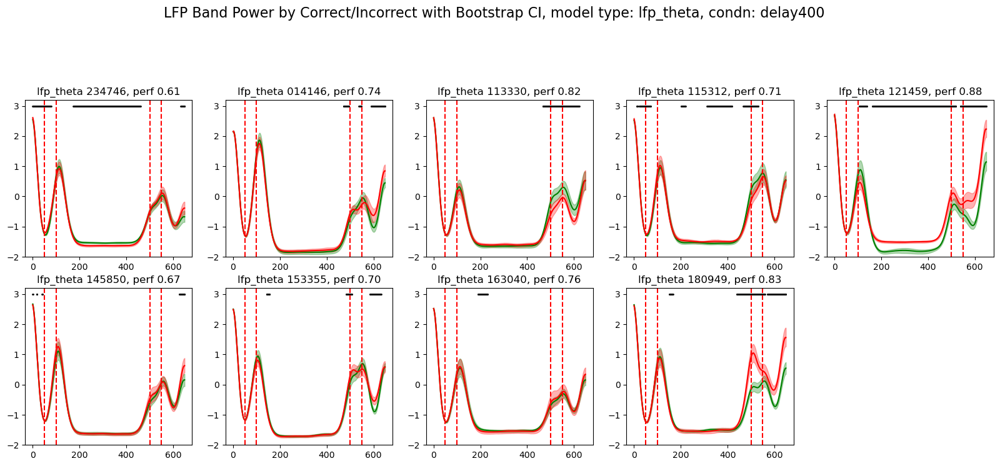

In [ ]:
# make plot: bandpower by correct/incorrect w bootstrapping; NO LESION

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_name = 'delay400'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # finally plot band power, split by correct/incorrect
    ax = fig.add_subplot(4, 5, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    
    t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerband[correct_trials, :], 
                                                                                            trial_powerband[incorrect_trials, :], 
                                                                                            nboot, CI_int, n_jobs=-1, random_seed=None)
    
    ax.plot(t1_avg.mean(axis=1), color='g', label='correct')
    ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax.plot(t2_avg.mean(axis=1), color='r', label='incorrect')
    ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='r', alpha=0.3)
    # plot bar for significant difference
    sig_idx = np.where(p_diff < 0.05)[0]
    ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
    ax.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax.set_ylim([-2, 3.2])

fig.suptitle(f'LFP Band Power by Correct/Incorrect with Bootstrap CI, model type: {model_list_name}, condn: {condn_name}', fontsize=16);


Processing model type: lfp_theta, number of models: 9


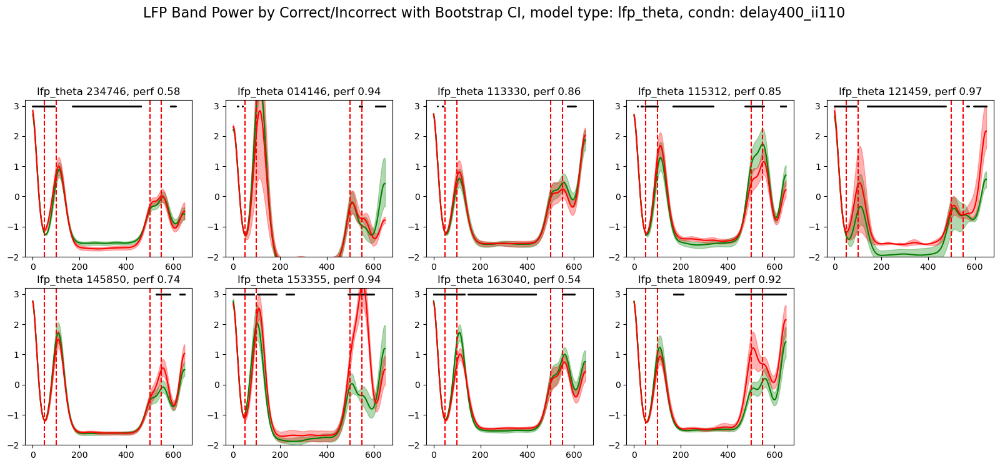

In [ ]:
# make plot: bandpower by correct/incorrect w bootstrapping; LESION 110

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_name = 'delay400_ii110'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # finally plot band power, split by correct/incorrect
    ax = fig.add_subplot(4, 5, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    
    t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerband[correct_trials, :], 
                                                                                            trial_powerband[incorrect_trials, :], 
                                                                                            nboot, CI_int, n_jobs=-1, random_seed=None)
    
    ax.plot(t1_avg.mean(axis=1), color='g', label='correct')
    ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax.plot(t2_avg.mean(axis=1), color='r', label='incorrect')
    ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='r', alpha=0.3)
    # plot bar for significant difference
    sig_idx = np.where(p_diff < 0.05)[0]
    ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
    ax.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax.set_ylim([-2, 3.2])

fig.suptitle(f'LFP Band Power by Correct/Incorrect with Bootstrap CI, model type: {model_list_name}, condn: {condn_name}', fontsize=16);


Processing model type: lfp_theta, number of models: 9


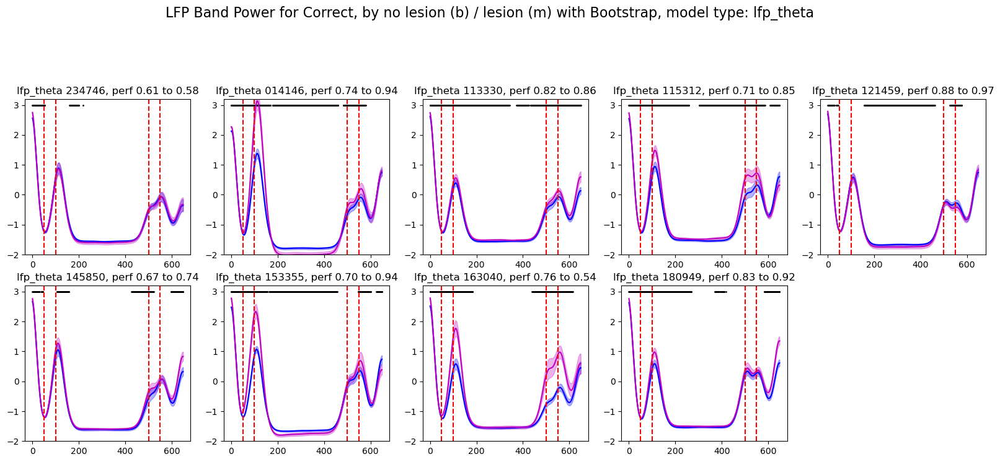

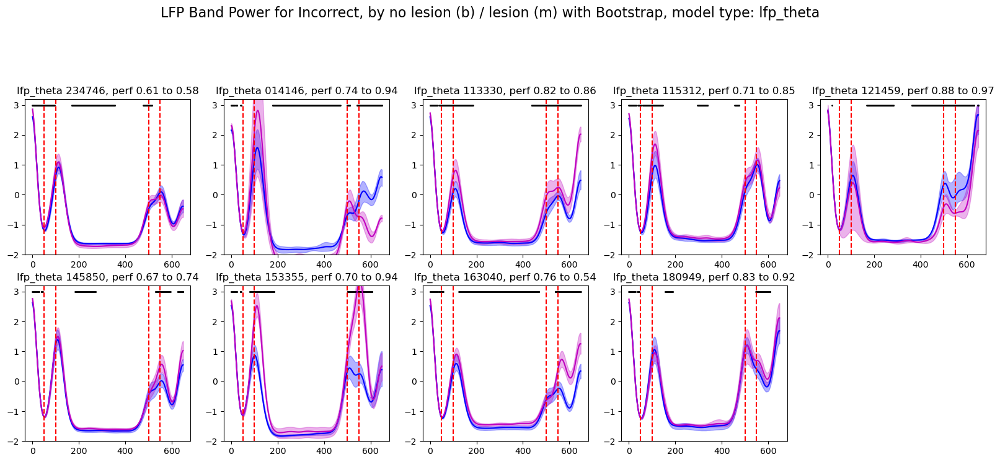

In [55]:
# make plot: bandpower by no lesion / lesion w bootstrapping

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_names = ['delay400', 'delay400_ii110']

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig1 = plt.figure(figsize=(20, 15)) # band power, correct, split by lesion/no lesion
fig2 = plt.figure(figsize=(20, 15)) # band power, incorrect, split by lesion/no lesion

perfs = np.zeros((len(model_list), len(condn_names)))
for i, model_name in enumerate(model_list):
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    trial_powerband_corr = []
    trial_powerband_incorr = []
    
    for j, condn_name in enumerate(condn_names):
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        perfs[i, j] = np.mean(bhv_dict['perf'])
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for k in range(n_trials):
            trial_power, freqs, trial_powerband[k, :] = compute_lfp_power_np(neural_dict['epsp'][k, :], settings)
            avg_power += trial_power / n_trials
            
        # split by correct/incorrect
        
        correct_trials = (np.array(bhv_dict['perf']) == 1)
        incorrect_trials = (np.array(bhv_dict['perf']) == 0)
        
        trial_powerband_corr.append(trial_powerband[correct_trials, :])
        trial_powerband_incorr.append(trial_powerband[incorrect_trials, :])
    
    for fig in [fig1, fig2]:
        if fig == fig1:
            trial_powerband = trial_powerband_corr
            title_str = 'correct'
        else:
            trial_powerband = trial_powerband_incorr
            title_str = 'incorrect'
    
        t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerband[0], 
                                                                                            trial_powerband[1], 
                                                                                            nboot, CI_int, n_jobs=-1, random_seed=None)
        ax = fig.add_subplot(4, 5, model_list.index(model_name)+1)
    
        ax.plot(t1_avg.mean(axis=1), color='b', label=condn_names[0])
        ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='b', alpha=0.3)
        ax.plot(t2_avg.mean(axis=1), color='m', label=condn_names[1])
        ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='m', alpha=0.3)
        # plot bar for significant difference
        sig_idx = np.where(p_diff < 0.05)[0]
        ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
        ax.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {perfs[i,0]:.2f} to {perfs[i,1]:.2f}')
        ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
        ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
        ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
        ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
        ax.set_ylim([-2, 3.2])

fig1.suptitle(f'LFP Band Power for Correct, by no lesion (b) / lesion (m) with Bootstrap, model type: {model_list_name}', fontsize=16);
fig2.suptitle(f'LFP Band Power for Incorrect, by no lesion (b) / lesion (m) with Bootstrap, model type: {model_list_name}', fontsize=16);


Processing model type: lfp_theta, number of models: 9


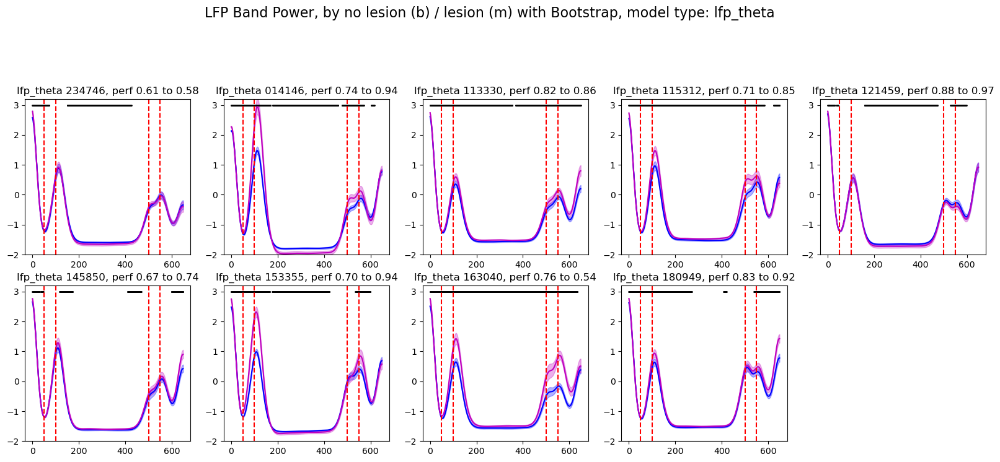

In [59]:
# make plot: bandpower by no lesion / lesion w bootstrapping

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_names = ['delay400', 'delay400_ii110']

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig = plt.figure(figsize=(20, 15)) # band power, split by lesion/no lesion

perfs = np.zeros((len(model_list), len(condn_names)))
for i, model_name in enumerate(model_list):
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    trial_powerbands = []
    
    for j, condn_name in enumerate(condn_names):
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        perfs[i, j] = np.mean(bhv_dict['perf'])
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for k in range(n_trials):
            trial_power, freqs, trial_powerband[k, :] = compute_lfp_power_np(neural_dict['epsp'][k, :], settings)
            avg_power += trial_power / n_trials
        
        trial_powerbands.append(trial_powerband)
    
    t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerbands[0], 
                                                                                        trial_powerbands[1], 
                                                                                        nboot, CI_int, n_jobs=-1, random_seed=820)
    ax = fig.add_subplot(4, 5, model_list.index(model_name)+1)

    ax.plot(t1_avg.mean(axis=1), color='b', label=condn_names[0])
    ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='b', alpha=0.3)
    ax.plot(t2_avg.mean(axis=1), color='m', label=condn_names[1])
    ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='m', alpha=0.3)
    # plot bar for significant difference
    sig_idx = np.where(p_diff < 0.05)[0]
    ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
    ax.set_title(f'{model_list_name} {model_name[-10:-4]}, perf {perfs[i,0]:.2f} to {perfs[i,1]:.2f}')
    ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax.set_ylim([-2, 3.2])
    # ax.legend()

fig.suptitle(f'LFP Band Power, by no lesion (b) / lesion (m) with Bootstrap, model type: {model_list_name}', fontsize=16);


### separate out models with performance improvement

In [7]:
better_models_idx = np.where(perfs_condn[1,:] < perfs_condn[2,:])[0]
print(f'Number of better performing models: {len(better_models_idx)}')
worse_models_idx = np.where(perfs_condn[1,:] > perfs_condn[2,:])[0]
print(f'Number of worse performing models: {len(worse_models_idx)}')

Number of better performing models: 28
Number of worse performing models: 10


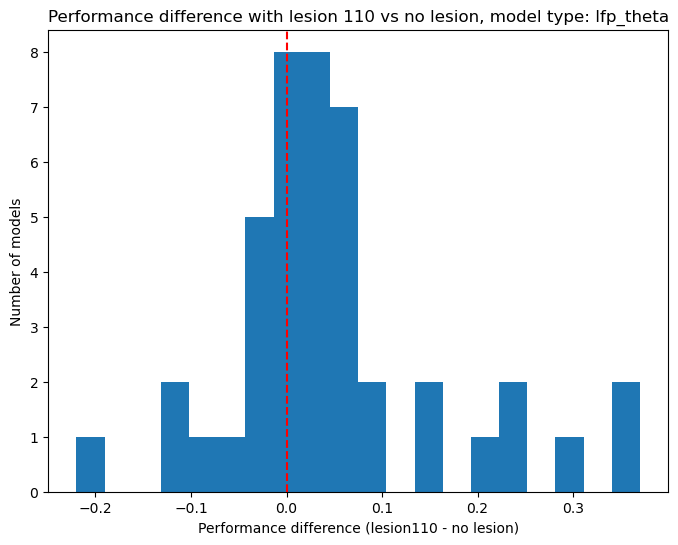

In [8]:
# plot difference btwn performance with lesion vs no lesion
plt.figure(figsize=(8,6))
plt.hist(perfs_condn[2,:] - perfs_condn[1,:], bins=20)
plt.xlabel('Performance difference (lesion110 - no lesion)')
plt.ylabel('Number of models')
plt.title(f'Performance difference with lesion 110 vs no lesion, model type: {model_list_name}')
plt.axvline(x=0, color='r', linestyle='--');

#### improved models

PCA explained variance: [0.59823141 0.11843653 0.07824777], total: 0.7949157124681462
PCA explained variance: [0.65573782 0.10755728 0.05988136], total: 0.8231764521656972
PCA explained variance: [0.67829611 0.0961982  0.06410512], total: 0.8385994407092335
PCA explained variance: [0.41359526 0.25491437 0.13080811], total: 0.799317739131107
PCA explained variance: [0.48052919 0.1910101  0.1022445 ], total: 0.7737837895313991
PCA explained variance: [0.52753669 0.16741941 0.10002133], total: 0.7949774332908645
PCA explained variance: [0.6162389  0.12207663 0.07890745], total: 0.817222985063174
PCA explained variance: [0.63891307 0.12777428 0.06068604], total: 0.8273733948247759
PCA explained variance: [0.66209129 0.12982352 0.06252284], total: 0.8544376486883141
PCA explained variance: [0.59799783 0.21106384 0.06151635], total: 0.8705780154317295
PCA explained variance: [0.34185288 0.29377254 0.13139028], total: 0.7670157094288429
PCA explained variance: [0.44302512 0.21844165 0.1077634

Text(0.5, 0.98, 'Population trajectory PCA, model type: lfp_theta, condn: delay400')

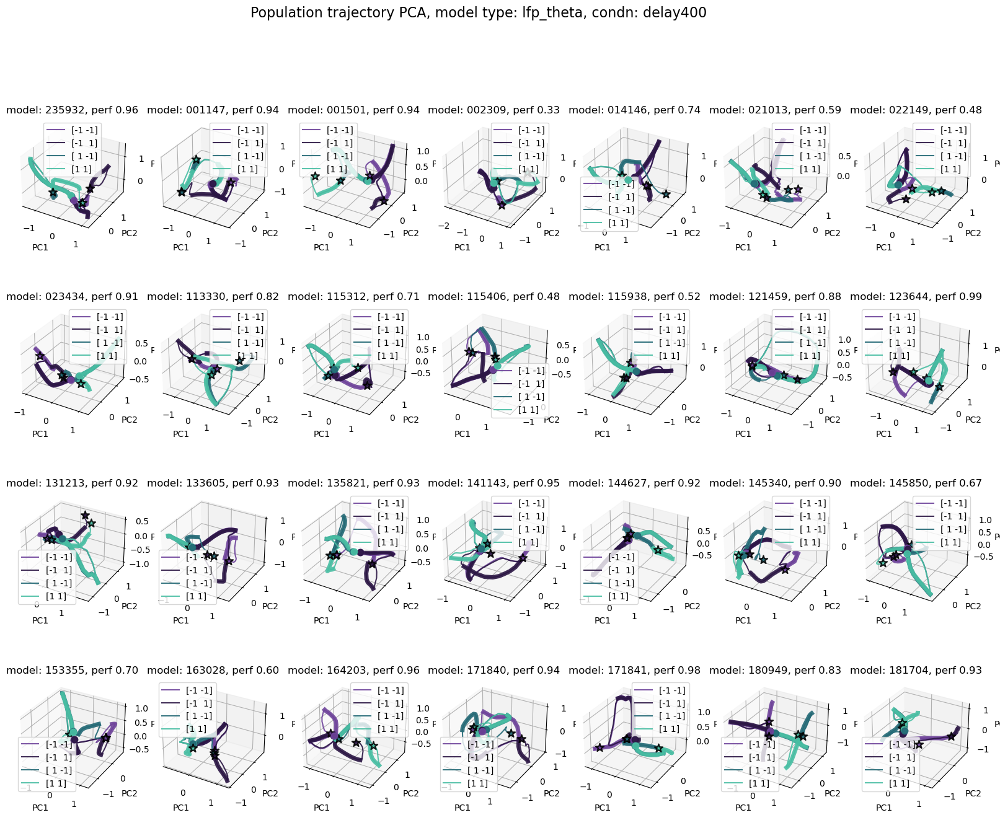

In [15]:
# trajectories for correct trials only

model_list = [lfp_theta_model_list[i] for i in better_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400'

# create figure
fig = plt.figure(figsize=(20, 15))

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    correct_trials = np.where(bhv_dict['perf'] == 1)[0]
    neural_dict['r'] = neural_dict['r']#[correct_trials, :, :]
    bhv_dict['trial_type'] = np.array(bhv_dict['trial_type'])#[correct_trials]
    bhv_dict['perf'] = np.array(bhv_dict['perf'])#[correct_trials]
    
    ax = fig.add_subplot(4, 7, model_list.index(model_name)+1, projection='3d')
    ax, _ = pu.plot_trajectory_pca(rates_data=neural_dict['r'], trial_labels=np.array(bhv_dict['trial_type']), 
                    settings=settings, cut_off=50, plot=1, ds=5, smooth=2, ax=ax,
                    title=f'model: {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')

fig.suptitle(f'Population trajectory PCA, model type: {model_list_name}, condn: {condn_name}', fontsize=16)

PCA explained variance: [0.6100196  0.11338646 0.06517136], total: 0.7885774269488505
PCA explained variance: [0.64878354 0.10712759 0.07050111], total: 0.8264122433317608
PCA explained variance: [0.72656958 0.08655957 0.04950993], total: 0.8626390760043864
PCA explained variance: [0.41740892 0.23782652 0.13762584], total: 0.7928612878169063
PCA explained variance: [0.72423734 0.09055668 0.05552555], total: 0.870319567335756
PCA explained variance: [0.70136742 0.11448588 0.06347314], total: 0.8793264402411345
PCA explained variance: [0.63858931 0.10995645 0.06154986], total: 0.8100956222360919
PCA explained variance: [0.63897522 0.13333481 0.07707175], total: 0.8493817806624038
PCA explained variance: [0.71687015 0.09098179 0.07106226], total: 0.8789142001412854
PCA explained variance: [0.60812673 0.20035428 0.05795998], total: 0.8664409861068217
PCA explained variance: [0.51771184 0.19461162 0.10329578], total: 0.8156192397335463
PCA explained variance: [0.58949061 0.17134268 0.080648

Text(0.5, 0.98, 'Population trajectory PCA, model type: lfp_theta, condn delay400_ii110')

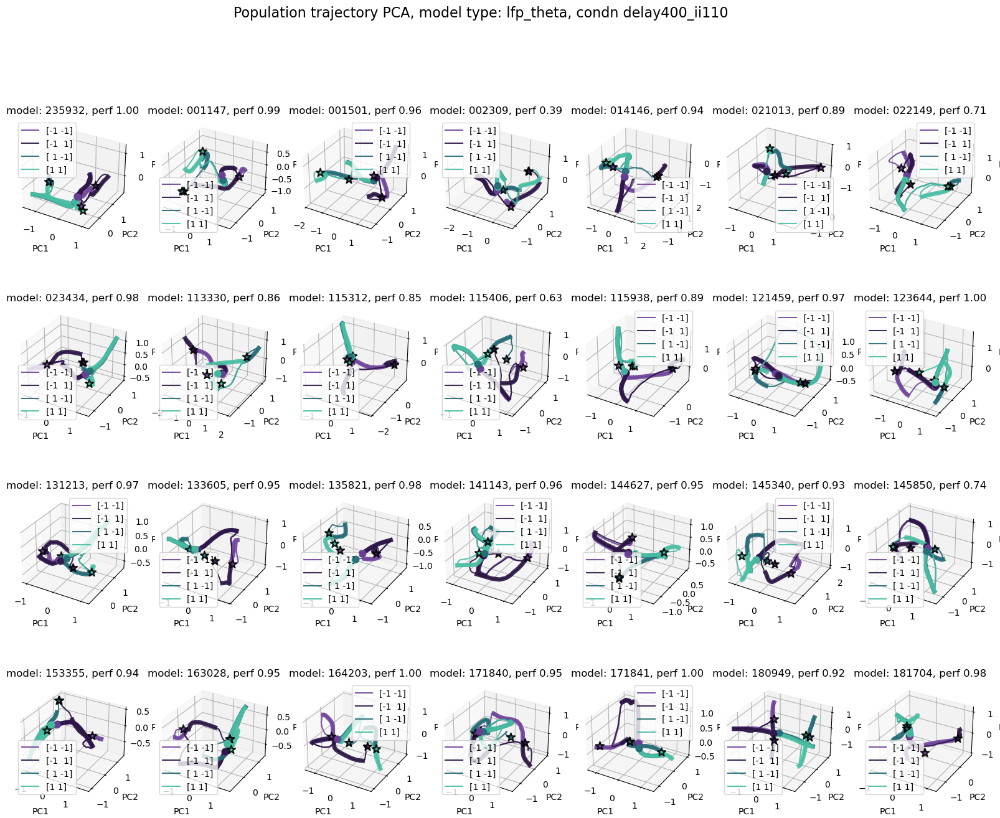

In [14]:
# trajectories for correct trials only -- LESION 110

model_list = [lfp_theta_model_list[i] for i in better_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400_ii110'

# create figure
fig = plt.figure(figsize=(20, 15))

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    correct_trials = np.where(bhv_dict['perf'] == 1)[0]
    neural_dict['r'] = neural_dict['r']#[correct_trials, :, :]
    bhv_dict['trial_type'] = np.array(bhv_dict['trial_type'])#[correct_trials]
    bhv_dict['perf'] = np.array(bhv_dict['perf'])#[correct_trials]
    
    ax = fig.add_subplot(4, 7, model_list.index(model_name)+1, projection='3d')
    ax, _ = pu.plot_trajectory_pca(rates_data=neural_dict['r'], trial_labels=np.array(bhv_dict['trial_type']), 
                    settings=settings, cut_off=50, plot=1, ds=5, smooth=2, ax=ax,
                    title=f'model: {model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')

fig.suptitle(f'Population trajectory PCA, model type: {model_list_name}, condn {condn_name}', fontsize=16)

##### plot EPSP

In [16]:
# spect calculation function in numpy

def compute_lfp_power_np(epsp, settings):
    """
    Compute band-limited z-scored LFP power using Morlet wavelets (NumPy version).

    Parameters
    ----------
    epsp : list or np.ndarray
        Length-T list or array of scalar values (e.g., EPSP signal).
    settings : dict
        Dictionary containing:
            - 'T': int, length of the signal
            - 'fs': float, sampling frequency in Hz
            - 'lfp_power_target': list or tuple of [low_freq, high_freq]
            - 'stim_on': int, time index of stimulus onset

    Returns
    -------
    lfp_power_z : np.ndarray
        Z-scored LFP power in the target frequency band. Shape [T]
    """
    # --- settings ---
    T = settings['T']
    fs = settings['fs']
    dt = 1.0 / fs
    fmin, fmax = 4.0, 100.0
    num_freqs = 40
    band_lo, band_hi = settings['lfp_power_target']
    stim_on = settings['stim_on']

    # --- epsp input processing ---
    epsp_vec = np.squeeze(np.stack(epsp, axis=0))  # [T]
    epsp_sig = np.reshape(epsp_vec, [1, T, 1])      # [1, T, 1]

    # --- frequencies & scales ---
    freqs = np.exp(np.linspace(np.log(fmin), np.log(fmax), num_freqs))
    fc = 0.8125  # Morlet central frequency
    scales = fc / (freqs * dt)

    # --- build Morlet kernels ---
    K = 6.0
    f_low = fmin
    sigma_t_low = K / (2.0 * np.pi * f_low)
    half_width_sec = 4.0 * sigma_t_low
    kernel_len = int(round(2.0 * half_width_sec * fs) + 1)
    kernel_len = max(kernel_len, 31)

    t_idx = np.arange(kernel_len, dtype=np.float32) - (kernel_len - 1) / 2.0
    t_sec = t_idx / fs

    two_pi = 2.0 * np.pi
    sigma_t = K / (two_pi * freqs)  # [F]

    env = np.exp(-0.5 * (np.expand_dims(t_sec, 1) / np.expand_dims(sigma_t, 0))**2)
    phase = two_pi * np.expand_dims(t_sec, 1) * np.expand_dims(freqs, 0)
    cos_part = env * np.cos(phase)
    sin_part = env * np.sin(phase)

    # L2 normalize
    eps_norm = 1e-8
    norm = np.sqrt(np.sum(cos_part**2 + sin_part**2, axis=0, keepdims=True) + eps_norm)
    cos_part /= norm
    sin_part /= norm

    # Filters: [L, 1, F]
    cos_filt = np.expand_dims(cos_part, axis=1)
    sin_filt = np.expand_dims(sin_part, axis=1)

    # --- convolution with SAME padding ---
    def conv1d_same(x, filt):
        pad_len = filt.shape[0] // 2
        x_padded = np.pad(x, ((0, 0), (pad_len, pad_len), (0, 0)), mode='constant')
        output = np.zeros((x.shape[0], x.shape[1], filt.shape[2]))
        for f in range(filt.shape[2]):
            kernel = filt[:, 0, f][::-1]  # reverse for conv
            for b in range(x.shape[0]):
                output[b,:,f] = np.convolve(x_padded[b,:,0], kernel, mode='valid')
        return output

    real_coeff = conv1d_same(epsp_sig, cos_filt)  # [1, T, F]
    imag_coeff = conv1d_same(epsp_sig, sin_filt)  # [1, T, F]
    power = real_coeff**2 + imag_coeff**2        # [1, T, F]
    power = np.squeeze(power, axis=0)            # [T, F]

    # --- band selection ---
    band_mask = np.logical_and(freqs >= band_lo, freqs <= band_hi)
    band_mask_f = band_mask.astype(np.float32)
    denom = max(np.sum(band_mask_f), 1.0)
    band_power = np.dot(power, band_mask_f / denom)  # [T]

    # --- baseline z-scoring ---
    start = 10
    stop = int(stim_on)
    base_slice = band_power[start:stop]
    base_mean = np.mean(base_slice)
    base_std = np.std(base_slice) + 1e-8
    lfp_power_z = (band_power - base_mean) / base_std  # [T]

    return power, freqs, lfp_power_z


Processing model type: lfp_theta, number of models: 28


Text(0.5, 0.98, 'LFP Band Power by Correct/Incorrect, model type: lfp_theta, condn: delay400')

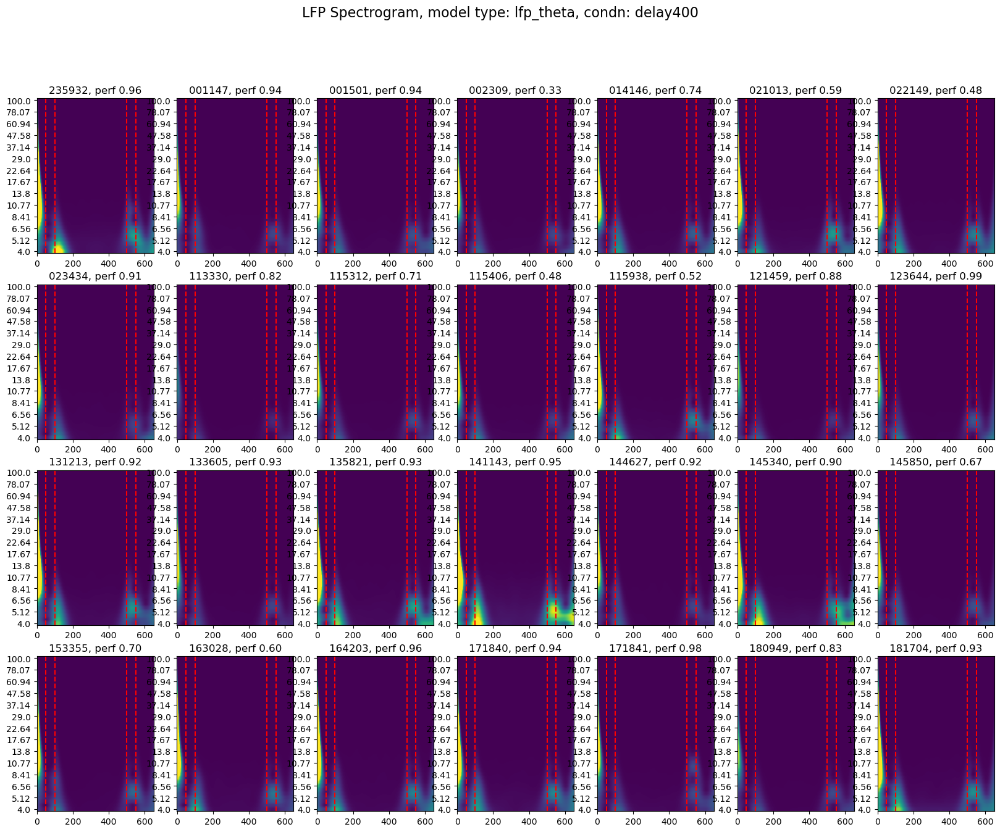

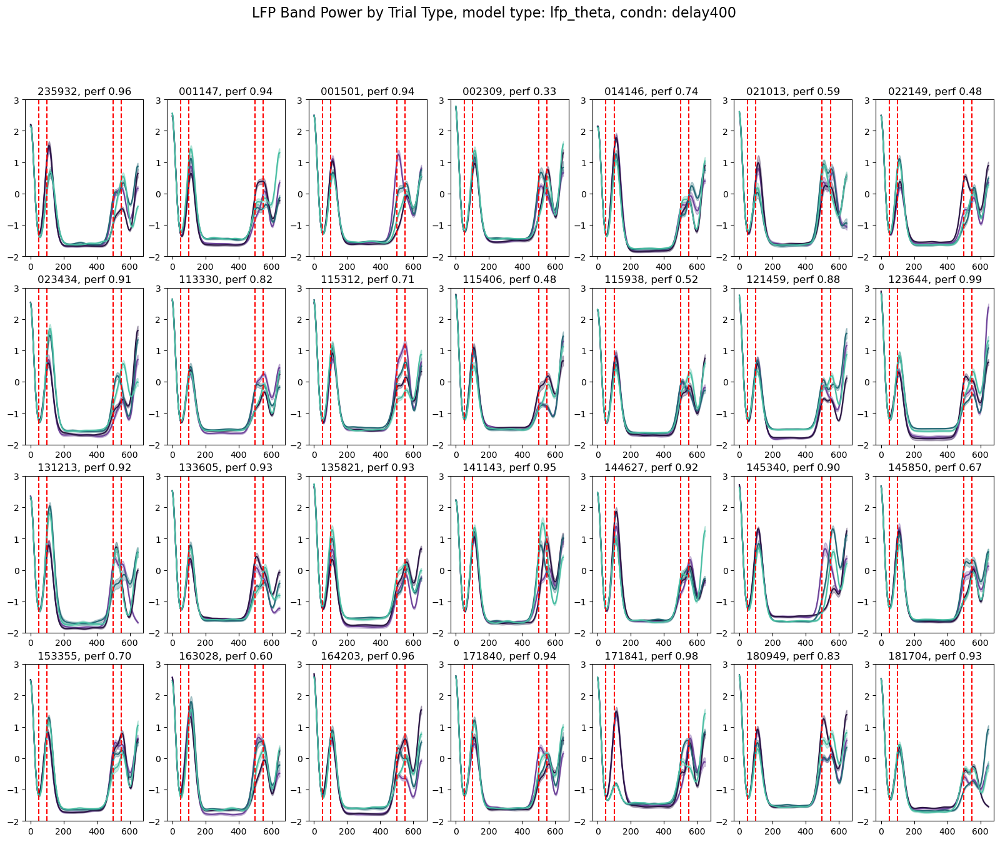

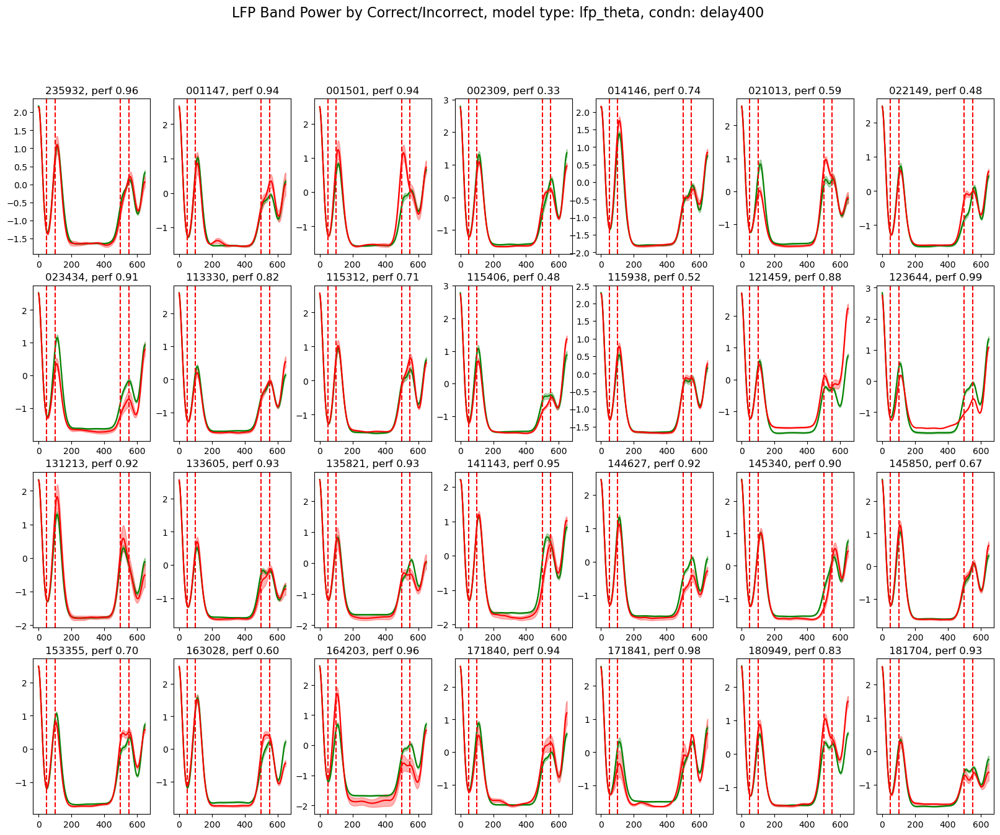

In [20]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- NO LESION

# model_list = lfp_theta_model_list
model_list = [lfp_theta_model_list[i] for i in better_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig1 = plt.figure(figsize=(20, 15)) # spectrogram
fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, 'neural_dict_delay400.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, 'bhv_dict_delay400.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # first plot spectrogram
    ax1 = fig1.add_subplot(4, 7, model_list.index(model_name)+1)
    ax1.imshow(avg_power.T, aspect='auto', origin='lower',
            vmin=0, vmax=1.2)
    ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
    # ax1.colorbar(label='Power')
    ax1.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    
    # then plot band power, split by trial type
    ax2 = fig2.add_subplot(4, 7, model_list.index(model_name)+1)
    stims, colors = ld.get_trialtype_colors()
    trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == i)
        powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
        powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
        ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
        ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
    ax2.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax2.set_ylim([-2, 3])
    
    # finally plot band power, split by correct/incorrect
    ax3 = fig3.add_subplot(4, 7, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
    ax3.plot(powerband_mean, color='g', label='correct')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax3.plot(powerband_mean, color='r', label='incorrect')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
    ax3.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')

fig1.suptitle(f'LFP Spectrogram, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig2.suptitle(f'LFP Band Power by Trial Type, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig3.suptitle(f'LFP Band Power by Correct/Incorrect, model type: {model_list_name}, condn: {condn_name}', fontsize=16)


Processing model type: lfp_theta, number of models: 28


/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib

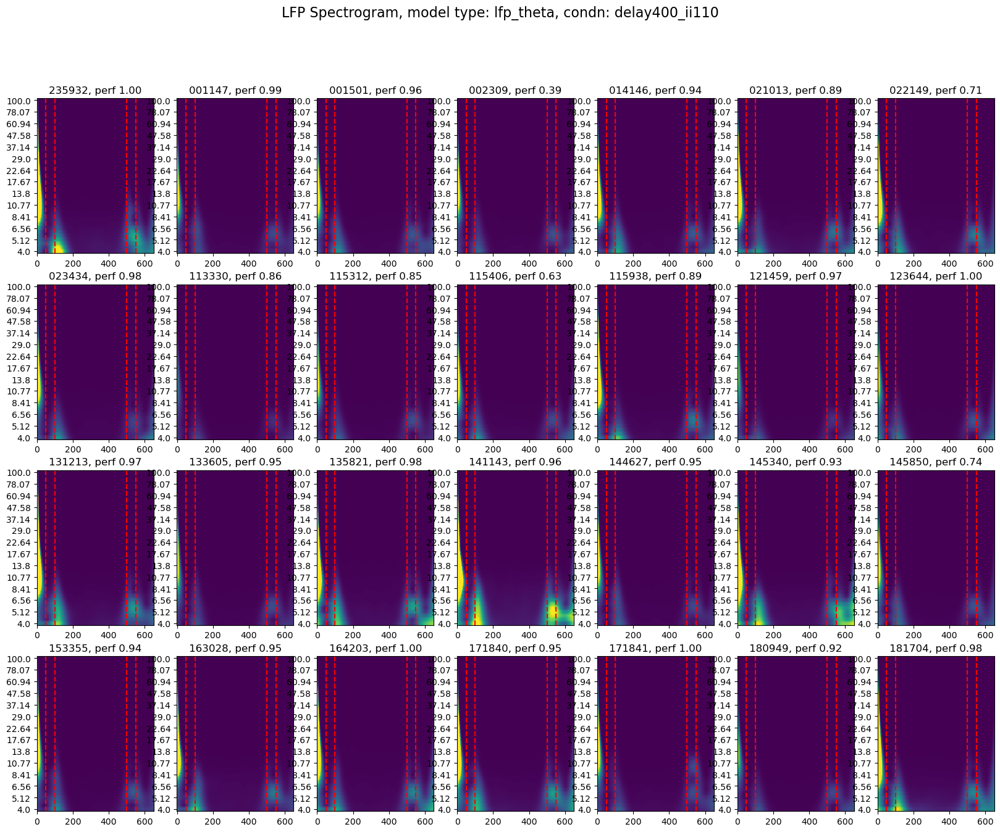

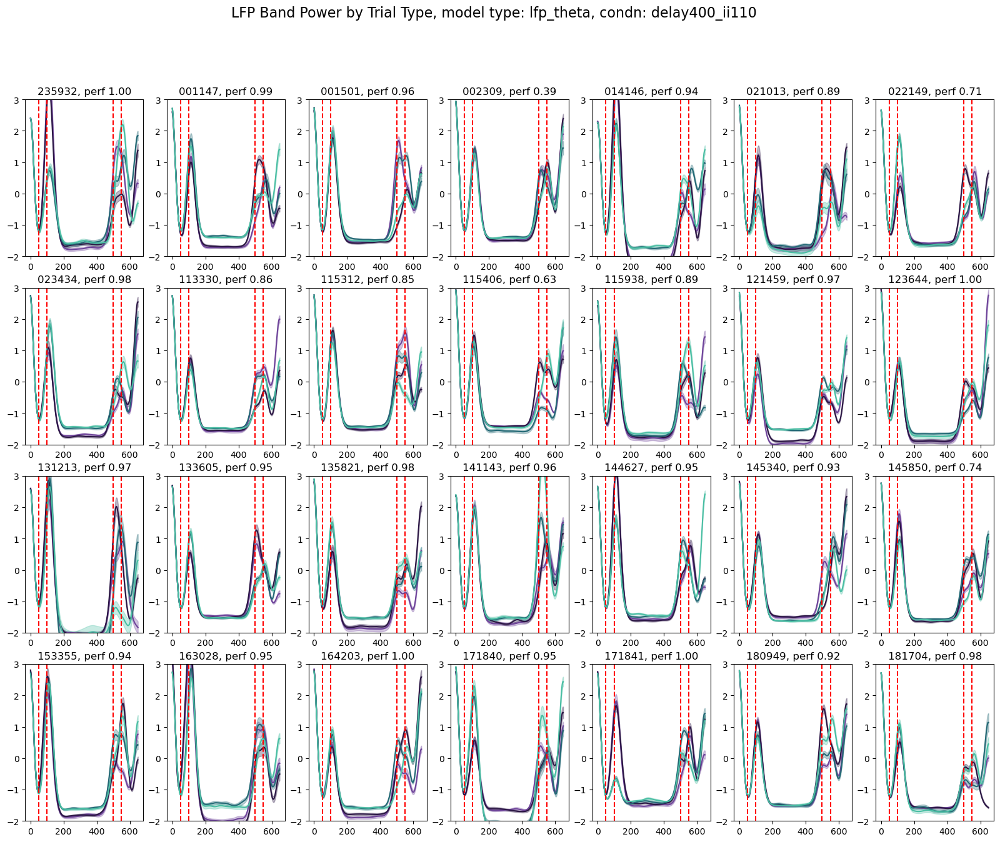

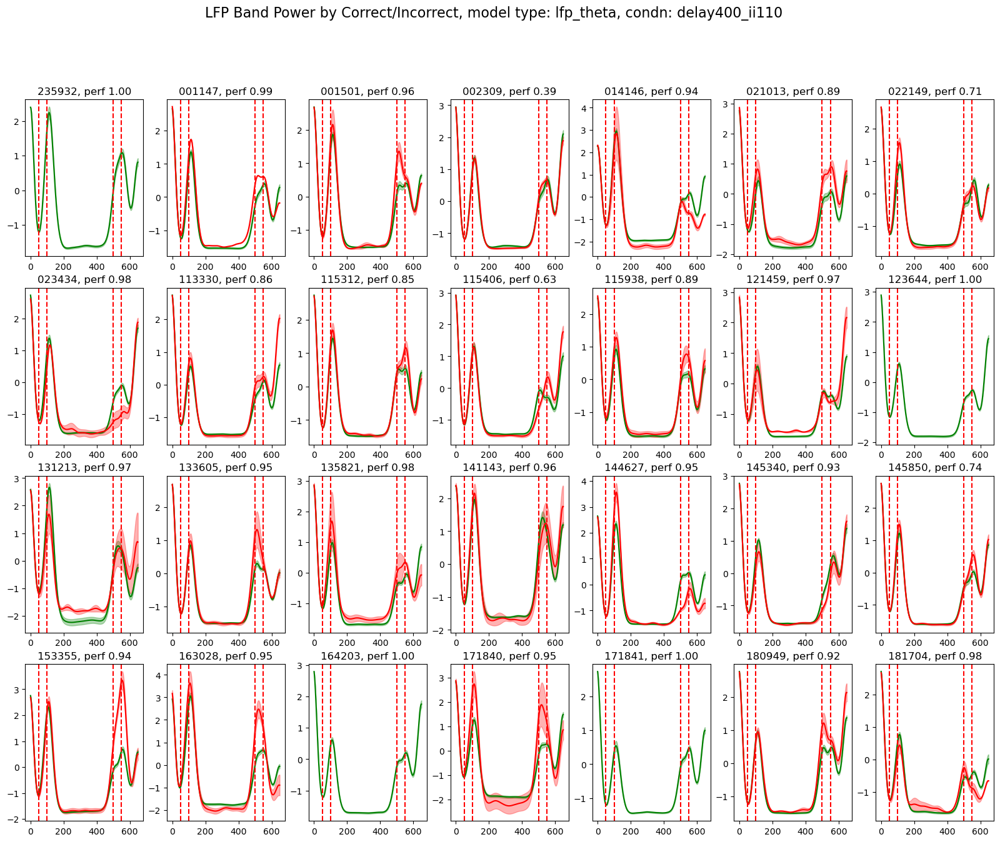

In [ ]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- LESION 110

# model_list = lfp_theta_model_list
model_list = [lfp_theta_model_list[i] for i in better_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400_ii110'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig1 = plt.figure(figsize=(20, 15)) # spectrogram
fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))

    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # first plot spectrogram
    ax1 = fig1.add_subplot(4, 7, model_list.index(model_name)+1)
    ax1.imshow(avg_power.T, aspect='auto', origin='lower',
            vmin=0, vmax=1.2)
    ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
    # ax1.colorbar(label='Power')
    ax1.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    
    # then plot band power, split by trial type
    ax2 = fig2.add_subplot(4, 7, model_list.index(model_name)+1)
    stims, colors = ld.get_trialtype_colors()
    trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == i)
        powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
        powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
        ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
        ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
    ax2.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax2.set_ylim([-2, 3])
    
    # finally plot band power, split by correct/incorrect
    ax3 = fig3.add_subplot(4, 7, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
    ax3.plot(powerband_mean, color='g', label='correct')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax3.plot(powerband_mean, color='r', label='incorrect')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
    ax3.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')

fig1.suptitle(f'LFP Spectrogram, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig2.suptitle(f'LFP Band Power by Trial Type, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig3.suptitle(f'LFP Band Power by Correct/Incorrect, model type: {model_list_name}, condn: {condn_name}', fontsize=16);

Processing model type: lfp_theta, number of models: 28


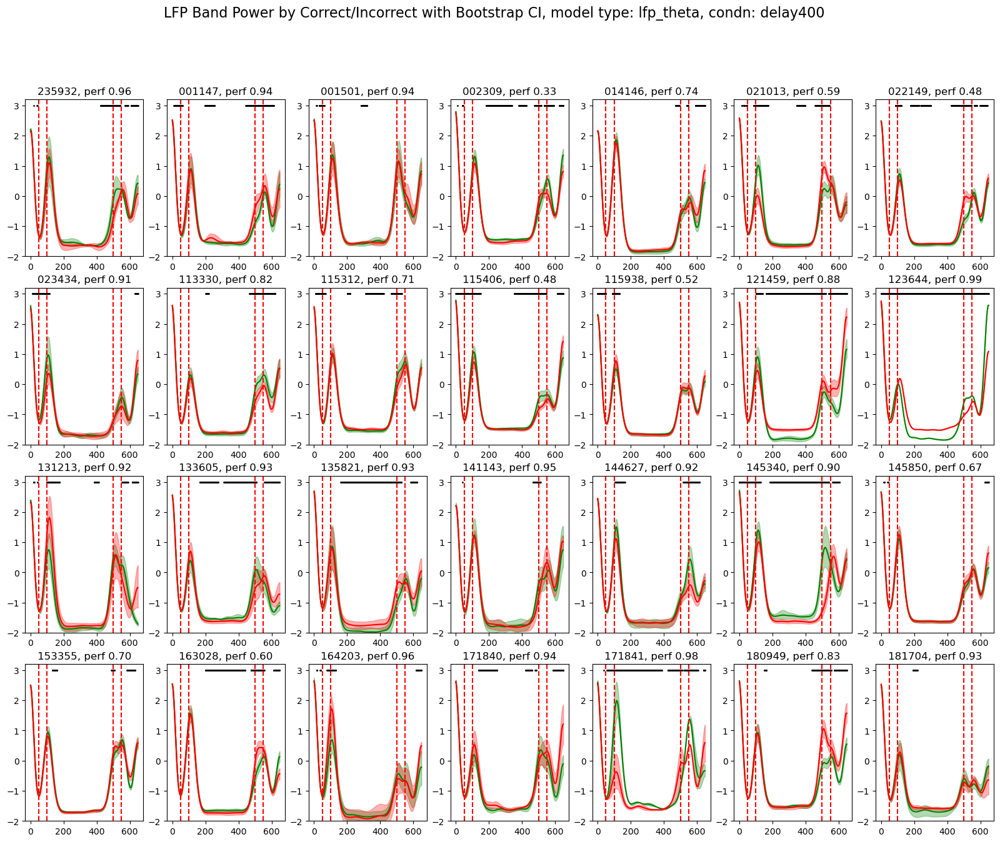

In [22]:
# make plot: bandpower by correct/incorrect w bootstrapping

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_name = 'delay400'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # finally plot band power, split by correct/incorrect
    ax = fig.add_subplot(4, 7, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    
    t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerband[correct_trials, :], 
                                                                                            trial_powerband[incorrect_trials, :], 
                                                                                            nboot, CI_int, n_jobs=-1, random_seed=None)
    
    ax.plot(t1_avg.mean(axis=1), color='g', label='correct')
    ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax.plot(t2_avg.mean(axis=1), color='r', label='incorrect')
    ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='r', alpha=0.3)
    # plot bar for significant difference
    sig_idx = np.where(p_diff < 0.05)[0]
    ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
    ax.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax.set_ylim([-2, 3.2])

fig.suptitle(f'LFP Band Power by Correct/Incorrect with Bootstrap CI, model type: {model_list_name}, condn: {condn_name}', fontsize=16);


Processing model type: lfp_theta, number of models: 28


/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils/bootstrap_method.py:126: RuntimeWarning: Mean of empty slice
  t1_avg = np.nanmean(t1_resampled, axis=1)
/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils/bootstrap_method.py:127: RuntimeWarning: Mean of empty slice
  t2_avg = np.nanmean(t2_resampled, axis=1)
/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils/bootstrap_method.py:126: RuntimeWarning: Mean of empty slice
  t1_avg = np.nanmean(t1_resampled, axis=1)
/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils/bootstrap_method.py:127: RuntimeWarning: Mean of empty slice
  t2_avg = np.nanmean(t2_resampled, axis=1)
/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils/bootstrap_method.py:126: RuntimeWarning: Mean of empty slice
  t1_avg = np.nanmean(t1_resampled, axis=1)
/home/nuttidalab/Documents/renee/spikeRNN/analysis/utils/bootstrap_method.py:127: RuntimeWarning: Mean of empty slice
  t2_avg = np.nanmean(t2_resampled, axis=1)
/home/nuttidalab/Documents/r

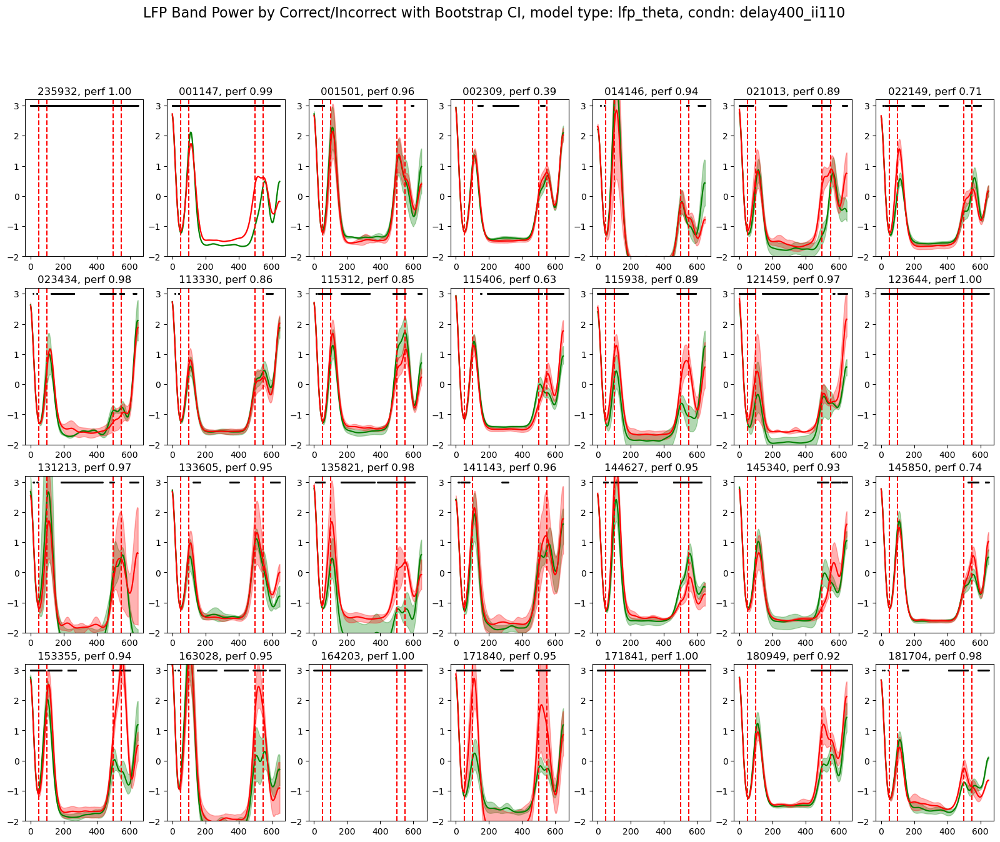

In [23]:
# make plot: bandpower by correct/incorrect w bootstrapping

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_name = 'delay400_ii110'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # finally plot band power, split by correct/incorrect
    ax = fig.add_subplot(4, 7, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    
    t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerband[correct_trials, :], 
                                                                                            trial_powerband[incorrect_trials, :], 
                                                                                            nboot, CI_int, n_jobs=-1, random_seed=None)
    
    ax.plot(t1_avg.mean(axis=1), color='g', label='correct')
    ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax.plot(t2_avg.mean(axis=1), color='r', label='incorrect')
    ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='r', alpha=0.3)
    # plot bar for significant difference
    sig_idx = np.where(p_diff < 0.05)[0]
    ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
    ax.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax.set_ylim([-2, 3.2])

fig.suptitle(f'LFP Band Power by Correct/Incorrect with Bootstrap CI, model type: {model_list_name}, condn: {condn_name}', fontsize=16);


Processing model type: lfp_theta, number of models: 28


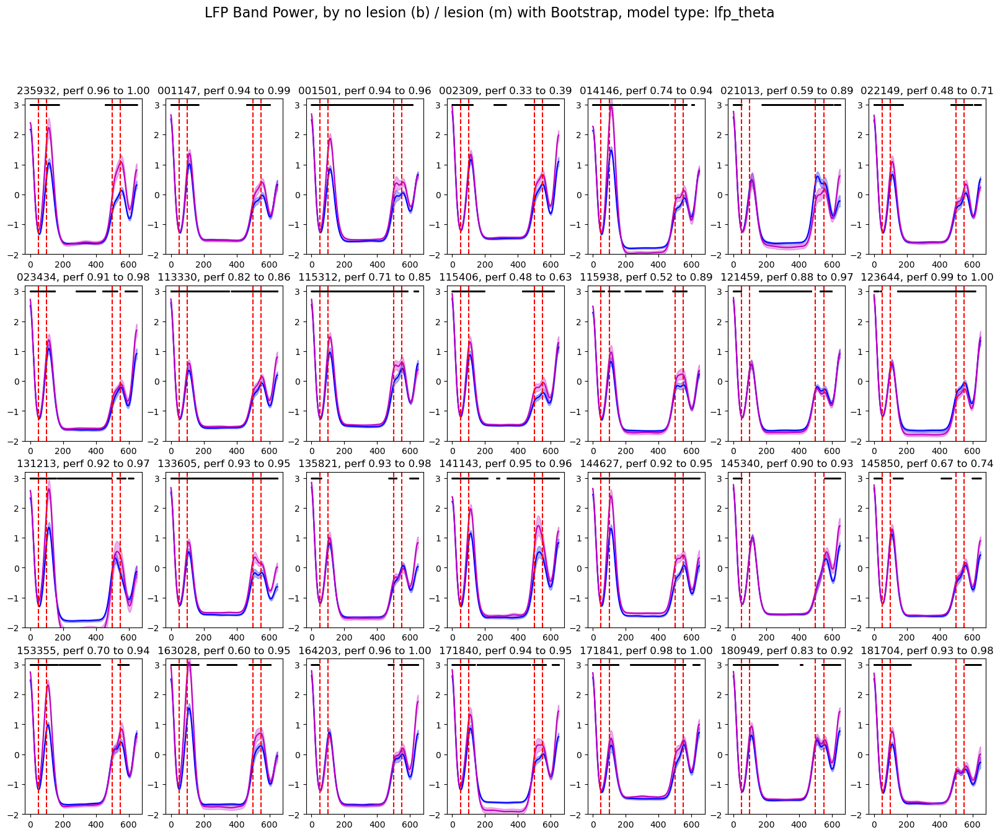

In [25]:
# make plot: bandpower by no lesion / lesion w bootstrapping

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_names = ['delay400', 'delay400_ii110']

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig = plt.figure(figsize=(20, 15)) # band power, split by lesion/no lesion

perfs = np.zeros((len(model_list), len(condn_names)))
for i, model_name in enumerate(model_list):
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    trial_powerbands = []
    
    for j, condn_name in enumerate(condn_names):
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        perfs[i, j] = np.mean(bhv_dict['perf'])
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for k in range(n_trials):
            trial_power, freqs, trial_powerband[k, :] = compute_lfp_power_np(neural_dict['epsp'][k, :], settings)
            avg_power += trial_power / n_trials
        
        trial_powerbands.append(trial_powerband)
    
    t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerbands[0], 
                                                                                        trial_powerbands[1], 
                                                                                        nboot, CI_int, n_jobs=-1, random_seed=820)
    ax = fig.add_subplot(4, 7, model_list.index(model_name)+1)

    ax.plot(t1_avg.mean(axis=1), color='b', label=condn_names[0])
    ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='b', alpha=0.3)
    ax.plot(t2_avg.mean(axis=1), color='m', label=condn_names[1])
    ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='m', alpha=0.3)
    # plot bar for significant difference
    sig_idx = np.where(p_diff < 0.05)[0]
    ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
    ax.set_title(f'{model_name[-10:-4]}, perf {perfs[i,0]:.2f} to {perfs[i,1]:.2f}')
    ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax.set_ylim([-2, 3.2])
    # ax.legend()

fig.suptitle(f'LFP Band Power, by no lesion (b) / lesion (m) with Bootstrap, model type: {model_list_name}', fontsize=16);


### worse models

Processing model type: lfp_theta, number of models: 10


/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:121: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:206: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:163: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
/home/nuttidalab/miniconda3/envs/rnn_test/lib/python3.11/site-packages/numpy/core/_methods.py:195: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/home/nuttidalab/miniconda3/envs/rnn_test/lib

Text(0.5, 0.98, 'LFP Band Power by Correct/Incorrect, model type: lfp_theta, condn: delay400')

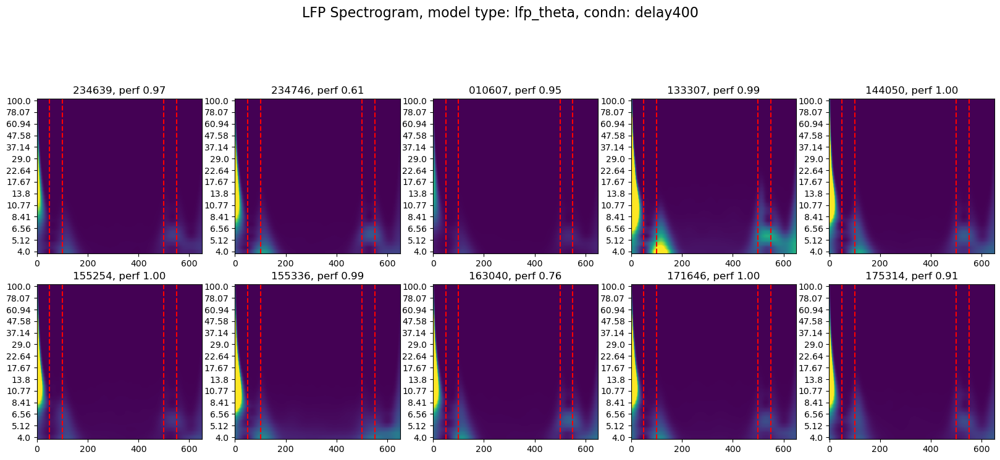

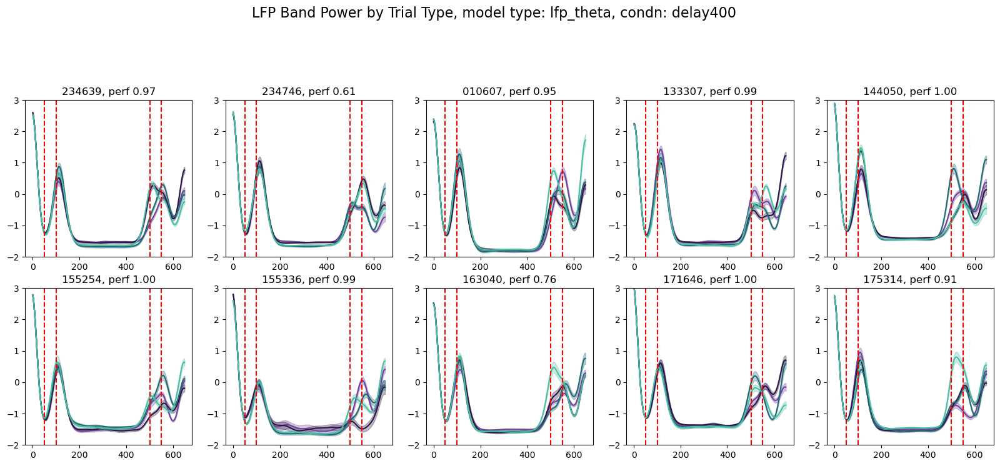

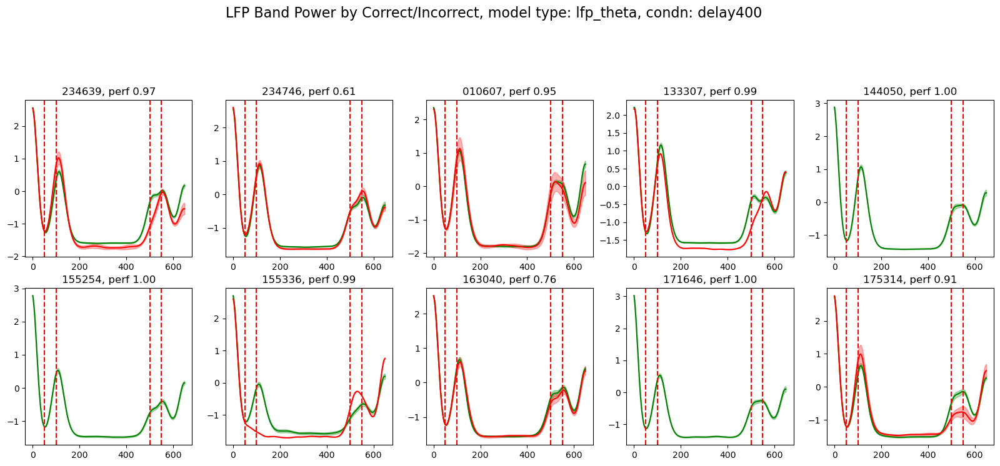

In [27]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- NO LESION

# model_list = lfp_theta_model_list
model_list = [lfp_theta_model_list[i] for i in worse_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig1 = plt.figure(figsize=(20, 15)) # spectrogram
fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, 'neural_dict_delay400.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, 'bhv_dict_delay400.pkl'), 'rb'))
    
    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # first plot spectrogram
    ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
    ax1.imshow(avg_power.T, aspect='auto', origin='lower',
            vmin=0, vmax=1.2)
    ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
    # ax1.colorbar(label='Power')
    ax1.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    
    # then plot band power, split by trial type
    ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
    stims, colors = ld.get_trialtype_colors()
    trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == i)
        powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
        powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
        ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
        ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
    ax2.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax2.set_ylim([-2, 3])
    
    # finally plot band power, split by correct/incorrect
    ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
    ax3.plot(powerband_mean, color='g', label='correct')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax3.plot(powerband_mean, color='r', label='incorrect')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
    ax3.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')

fig1.suptitle(f'LFP Spectrogram, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig2.suptitle(f'LFP Band Power by Trial Type, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig3.suptitle(f'LFP Band Power by Correct/Incorrect, model type: {model_list_name}, condn: {condn_name}', fontsize=16)


Processing model type: lfp_theta, number of models: 10


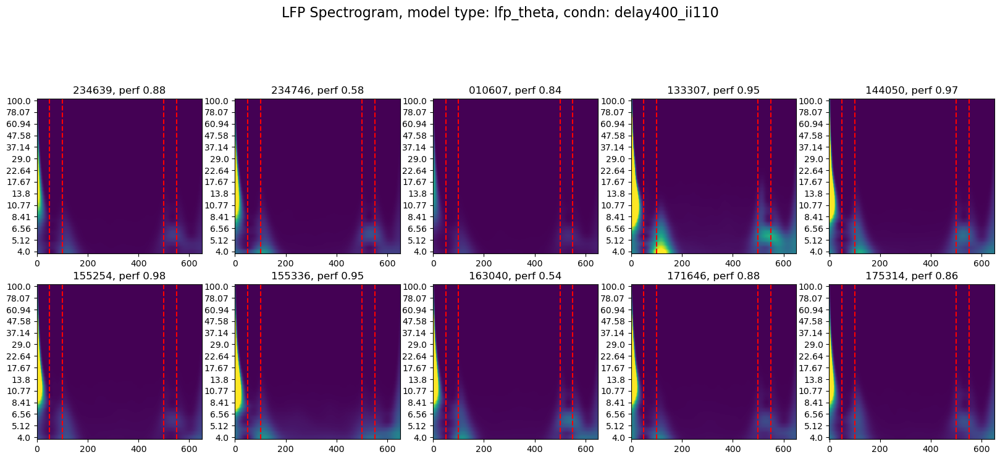

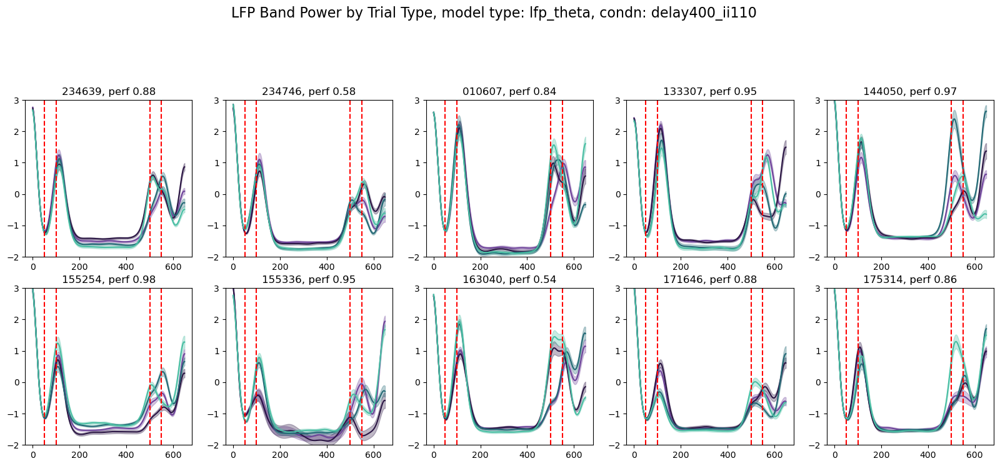

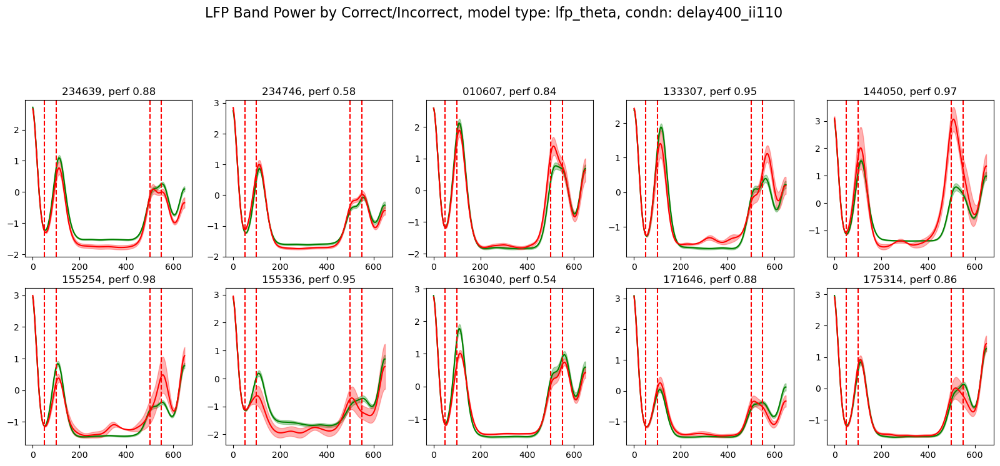

In [28]:
# make plots: spect, bandpower by trial type, bandpower by correct/incorrect -- LESION 110

# model_list = lfp_theta_model_list
model_list = [lfp_theta_model_list[i] for i in worse_models_idx]
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'
condn_name = 'delay400_ii110'

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig1 = plt.figure(figsize=(20, 15)) # spectrogram
fig2 = plt.figure(figsize=(20, 15)) # band power, split by trial type
fig3 = plt.figure(figsize=(20, 15)) # band power, split by correct/incorrect

for model_name in model_list:
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    # get neural and behavioral data
    neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
    bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))

    # calculate spectrogram data for all trials
    n_freqs = 40
    n_trials = neural_dict['epsp'].shape[0]

    trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
    avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
    for i in range(n_trials):
        trial_power, freqs, trial_powerband[i, :] = compute_lfp_power_np(neural_dict['epsp'][i, :], settings)
        avg_power += trial_power / n_trials
        
    # first plot spectrogram
    ax1 = fig1.add_subplot(4, 5, model_list.index(model_name)+1)
    ax1.imshow(avg_power.T, aspect='auto', origin='lower',
            vmin=0, vmax=1.2)
    ax1.set_yticks(np.arange(0, 40, 3), np.round(freqs[::3], 2))
    # ax1.colorbar(label='Power')
    ax1.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax1.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax1.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    
    # then plot band power, split by trial type
    ax2 = fig2.add_subplot(4, 5, model_list.index(model_name)+1)
    stims, colors = ld.get_trialtype_colors()
    trial_types, trial_idxs = np.unique(np.array(bhv_dict['trial_type']), axis=0, return_inverse=True)
    for i, trial_type in enumerate(trial_types):
        trials_idx = (trial_idxs == i)
        powerband_mean = np.mean(trial_powerband[trials_idx, :], axis=0)
        powerband_sem = np.std(trial_powerband[trials_idx, :], axis=0) / np.sqrt(np.sum(trials_idx))
        ax2.plot(powerband_mean, color=colors[i])#, label=stims[i])
        ax2.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color=colors[i], alpha=0.3)
    ax2.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax2.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax2.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax2.set_ylim([-2, 3])
    
    # finally plot band power, split by correct/incorrect
    ax3 = fig3.add_subplot(4, 5, model_list.index(model_name)+1)
    correct_trials = (np.array(bhv_dict['perf']) == 1)
    incorrect_trials = (np.array(bhv_dict['perf']) == 0)
    powerband_mean = np.mean(trial_powerband[correct_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[correct_trials, :], axis=0) / np.sqrt(np.sum(correct_trials))
    ax3.plot(powerband_mean, color='g', label='correct')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='g', alpha=0.3)
    powerband_mean = np.mean(trial_powerband[incorrect_trials, :], axis=0)
    powerband_sem = np.std(trial_powerband[incorrect_trials, :], axis=0) / np.sqrt(np.sum(incorrect_trials))
    ax3.plot(powerband_mean, color='r', label='incorrect')
    ax3.fill_between(np.arange(settings['T']), powerband_mean - powerband_sem, powerband_mean + powerband_sem, color='r', alpha=0.3)
    ax3.set_title(f'{model_name[-10:-4]}, perf {(np.mean(bhv_dict["perf"])):.2f}')
    ax3.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax3.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')

fig1.suptitle(f'LFP Spectrogram, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig2.suptitle(f'LFP Band Power by Trial Type, model type: {model_list_name}, condn: {condn_name}', fontsize=16)
fig3.suptitle(f'LFP Band Power by Correct/Incorrect, model type: {model_list_name}, condn: {condn_name}', fontsize=16);

Processing model type: lfp_theta, number of models: 10


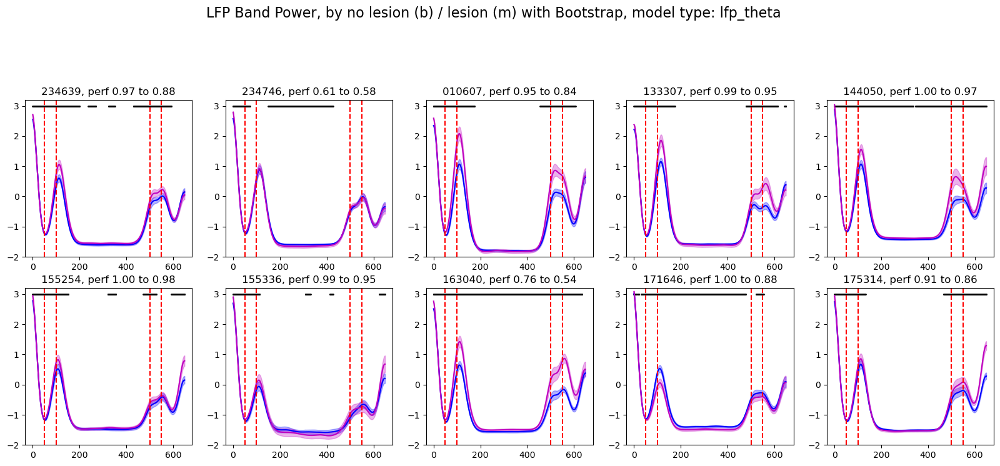

In [29]:
# make plot: bandpower by no lesion / lesion w bootstrapping

from bootstrap_method import fnc_time_bootstrap_optimized_retX

random_seed = 820
nboot = 1000
CI_int = (2.5, 97.5)

condn_names = ['delay400', 'delay400_ii110']

print(f'Processing model type: {model_list_name}, number of models: {len(model_list)}')

# create figure
fig = plt.figure(figsize=(20, 15)) # band power, split by lesion/no lesion

perfs = np.zeros((len(model_list), len(condn_names)))
for i, model_name in enumerate(model_list):
    # print(f"\nModel: {model_name}")
    output_dir = model_dir + '/' + model_name[:-4] + '/'
    
    trial_powerbands = []
    
    for j, condn_name in enumerate(condn_names):
        # get neural and behavioral data
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        perfs[i, j] = np.mean(bhv_dict['perf'])
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for k in range(n_trials):
            trial_power, freqs, trial_powerband[k, :] = compute_lfp_power_np(neural_dict['epsp'][k, :], settings)
            avg_power += trial_power / n_trials
        
        trial_powerbands.append(trial_powerband)
    
    t1_avg, t1_CI, t2_avg, t2_CI, diff_avg, diff_CI, p_diff = fnc_time_bootstrap_optimized_retX(trial_powerbands[0], 
                                                                                        trial_powerbands[1], 
                                                                                        nboot, CI_int, n_jobs=-1, random_seed=820)
    ax = fig.add_subplot(4, 5, model_list.index(model_name)+1)

    ax.plot(t1_avg.mean(axis=1), color='b', label=condn_names[0])
    ax.fill_between(np.arange(settings['T']), t1_CI[:,0], t1_CI[:,1], color='b', alpha=0.3)
    ax.plot(t2_avg.mean(axis=1), color='m', label=condn_names[1])
    ax.fill_between(np.arange(settings['T']), t2_CI[:,0], t2_CI[:,1], color='m', alpha=0.3)
    # plot bar for significant difference
    sig_idx = np.where(p_diff < 0.05)[0]
    ax.scatter(sig_idx, np.ones_like(sig_idx)*3, color='k', s=1)
    ax.set_title(f'{model_name[-10:-4]}, perf {perfs[i,0]:.2f} to {perfs[i,1]:.2f}')
    ax.axvline(x=settings['stim_on'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay'], color='r', linestyle='--')
    ax.axvline(x=settings['stim_on']+settings['stim_dur']+settings['delay']+settings['stim_dur'], color='r', linestyle='--')
    ax.set_ylim([-2, 3.2])
    # ax.legend()

fig.suptitle(f'LFP Band Power, by no lesion (b) / lesion (m) with Bootstrap, model type: {model_list_name}', fontsize=16);


### looking at all models together again

In [32]:
model_list = lfp_theta_model_list
model_dir = lfp_model_dir
model_list_name = 'lfp_theta'

#### mean over entire delay period

Wilcoxon test between no lesion and lesion models: stat 207.0, p 0.000968624545066632


/tmp/ipykernel_390035/2854849486.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([meanpower[:,0], meanpower[:,1]], labels=condn_names)


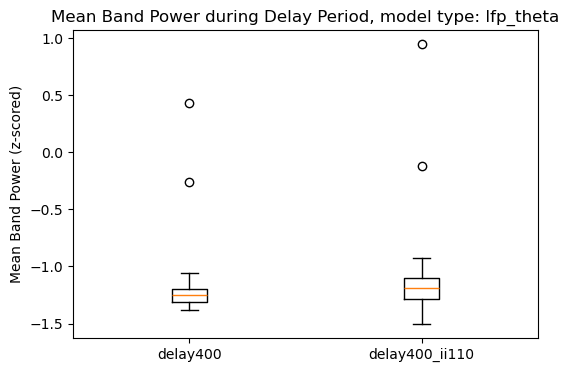

In [38]:
# calculate mean difference btwn no lesion and lesion models across time during the delay

condn_names = ['delay400', 'delay400_ii110']
time_period = (settings['stim_on']+settings['stim_dur'], settings['stim_on']+settings['stim_dur']+settings['delay']) # entire delay period

meanpower = np.zeros((len(model_list), len(condn_names)))
for i, model_name in enumerate(model_list):
    for j, condn_name in enumerate(condn_names):
        # get neural and behavioral data
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for k in range(n_trials):
            trial_power, freqs, trial_powerband[k, :] = compute_lfp_power_np(neural_dict['epsp'][k, :], settings)
            avg_power += trial_power / n_trials
        
        # timeavg_powerband = np.mean(trial_powerband[:, time_period[0]:time_period[1]], axis=1) # [N,]
        meanpower[i,j] = np.mean(trial_powerband[:, time_period[0]:time_period[1]])
        
plt.figure(figsize=(6,4))
plt.boxplot([meanpower[:,0], meanpower[:,1]], labels=condn_names)
plt.ylabel('Mean Band Power (z-scored)')
plt.title(f'Mean Band Power during Delay Period, model type: {model_list_name}')

from scipy.stats import wilcoxon
stat, p = wilcoxon(meanpower[:,0], meanpower[:,1])
print(f'Wilcoxon test between no lesion and lesion models: stat {stat}, p {p}')

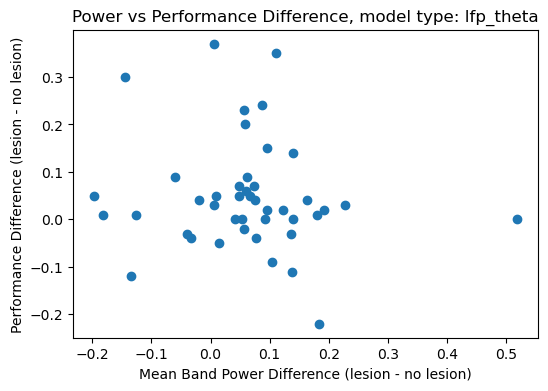

In [39]:
power_dif = meanpower[:,1] - meanpower[:,0] # lesion - no lesion
perf_dif = perfs_condn[2,:] - perfs_condn[1,:] # lesion - no lesion

plt.figure(figsize=(6,4))
plt.scatter(power_dif, perf_dif)
plt.xlabel('Mean Band Power Difference (lesion - no lesion)')
plt.ylabel('Performance Difference (lesion - no lesion)')
plt.title(f'Power vs Performance Difference, model type: {model_list_name}')
plt.show()

#### mean over start of delay (50 timesteps)

Wilcoxon test between no lesion and lesion models: stat 57.0, p 1.6400008462369442e-08


/tmp/ipykernel_390035/765598158.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([meanpower[:,0], meanpower[:,1]], labels=condn_names)


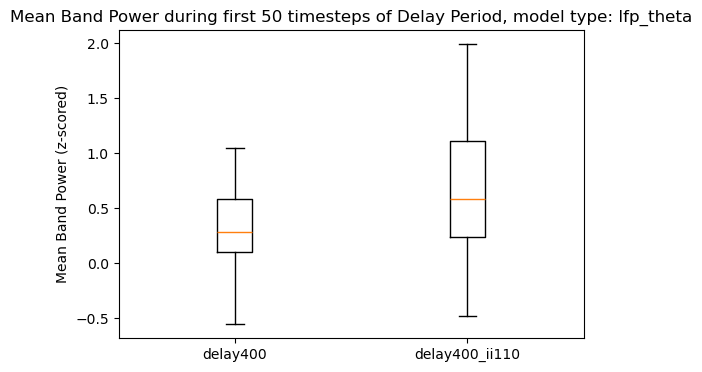

In [ ]:
# calculate mean difference btwn no lesion and lesion models across time during the first 50 timesteps of delay

condn_names = ['delay400', 'delay400_ii110']
time_period = (settings['stim_on']+settings['stim_dur'], settings['stim_on']+settings['stim_dur']+50) # first 50 timesteps of delay

meanpower = np.zeros((len(model_list), len(condn_names)))
for i, model_name in enumerate(model_list):
    for j, condn_name in enumerate(condn_names):
        # get neural and behavioral data
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for k in range(n_trials):
            trial_power, freqs, trial_powerband[k, :] = compute_lfp_power_np(neural_dict['epsp'][k, :], settings)
            avg_power += trial_power / n_trials
        
        # timeavg_powerband = np.mean(trial_powerband[:, time_period[0]:time_period[1]], axis=1) # [N,]
        meanpower[i,j] = np.mean(trial_powerband[:, time_period[0]:time_period[1]])
        
plt.figure(figsize=(6,4))
plt.boxplot([meanpower[:,0], meanpower[:,1]], labels=condn_names)
plt.ylabel('Mean Band Power (z-scored)')
plt.title(f'Mean Band Power during first 50 timesteps of Delay Period, model type: {model_list_name}')

from scipy.stats import wilcoxon
stat, p = wilcoxon(meanpower[:,0], meanpower[:,1])
print(f'Wilcoxon test between no lesion and lesion models: stat {stat}, p {p}')

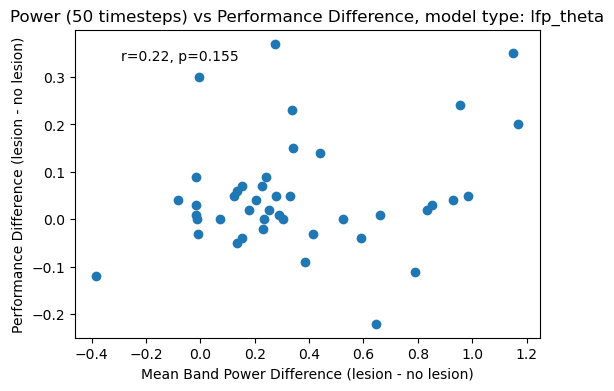

In [43]:
power_dif = meanpower[:,1] - meanpower[:,0] # lesion - no lesion
perf_dif = perfs_condn[2,:] - perfs_condn[1,:] # lesion - no lesion

plt.figure(figsize=(6,4))
plt.scatter(power_dif, perf_dif)

# plot correlation value
from scipy.stats import pearsonr
r, p = pearsonr(power_dif, perf_dif)
plt.text(0.1, 0.9, f'r={r:.2f}, p={p:.3f}', transform=plt.gca().transAxes)


plt.xlabel('Mean Band Power Difference (lesion - no lesion)')
plt.ylabel('Performance Difference (lesion - no lesion)')
plt.title(f'Power (50 timesteps) vs Performance Difference, model type: {model_list_name}')
plt.show()

#### mean over middle of delay (50 timesteps)

Wilcoxon test between no lesion and lesion models: stat 470.0, p 0.9761677595085985


/tmp/ipykernel_390035/536978260.py:28: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot([meanpower[:,0], meanpower[:,1]], labels=condn_names)


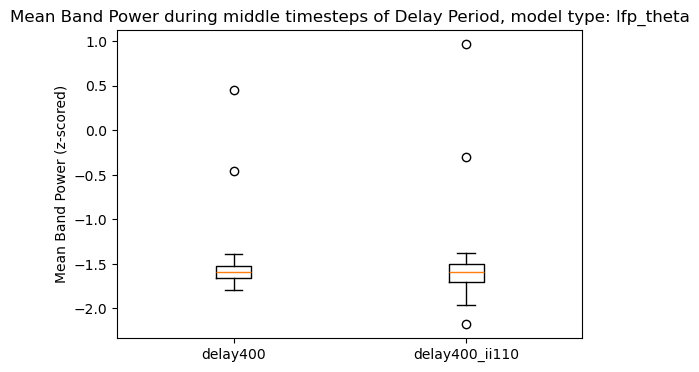

In [45]:
# calculate mean difference btwn no lesion and lesion models across time during the first 50 timesteps of delay

condn_names = ['delay400', 'delay400_ii110']
time_period = (200, 400) # middle of delay

meanpower = np.zeros((len(model_list), len(condn_names)))
for i, model_name in enumerate(model_list):
    for j, condn_name in enumerate(condn_names):
        # get neural and behavioral data
        output_dir = model_dir + '/' + model_name[:-4] + '/'
        neural_dict = pk.load(open(os.path.join(output_dir, f'neural_dict_{condn_name}.pkl'), 'rb'))
        bhv_dict = pk.load(open(os.path.join(output_dir, f'bhv_dict_{condn_name}.pkl'), 'rb'))
        
        # calculate spectrogram data for all trials
        n_freqs = 40
        n_trials = neural_dict['epsp'].shape[0]

        trial_powerband = np.zeros((n_trials, settings['T'])) # [N, T]
        avg_power = np.zeros((settings['T'], n_freqs)) # [T, F]
        for k in range(n_trials):
            trial_power, freqs, trial_powerband[k, :] = compute_lfp_power_np(neural_dict['epsp'][k, :], settings)
            avg_power += trial_power / n_trials
        
        # timeavg_powerband = np.mean(trial_powerband[:, time_period[0]:time_period[1]], axis=1) # [N,]
        meanpower[i,j] = np.mean(trial_powerband[:, time_period[0]:time_period[1]])
        
plt.figure(figsize=(6,4))
plt.boxplot([meanpower[:,0], meanpower[:,1]], labels=condn_names)
plt.ylabel('Mean Band Power (z-scored)')
plt.title(f'Mean Band Power during middle timesteps of Delay Period, model type: {model_list_name}')

from scipy.stats import wilcoxon
stat, p = wilcoxon(meanpower[:,0], meanpower[:,1])
print(f'Wilcoxon test between no lesion and lesion models: stat {stat}, p {p}')

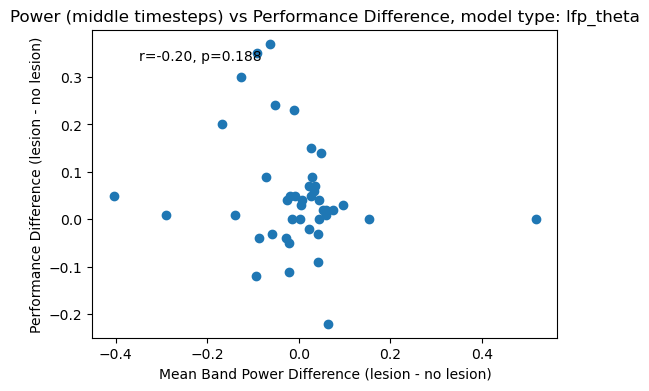

In [46]:
power_dif = meanpower[:,1] - meanpower[:,0] # lesion - no lesion
perf_dif = perfs_condn[2,:] - perfs_condn[1,:] # lesion - no lesion

plt.figure(figsize=(6,4))
plt.scatter(power_dif, perf_dif)

# plot correlation value
from scipy.stats import pearsonr
r, p = pearsonr(power_dif, perf_dif)
plt.text(0.1, 0.9, f'r={r:.2f}, p={p:.3f}', transform=plt.gca().transAxes)


plt.xlabel('Mean Band Power Difference (lesion - no lesion)')
plt.ylabel('Performance Difference (lesion - no lesion)')
plt.title(f'Power (middle timesteps) vs Performance Difference, model type: {model_list_name}')
plt.show()